## IMPORTING VARIOUS IMPORTANT LIBRARIES FOR THE IMPLEMENTATION OF THE DATA CLEANING , PREPROCESSING AND ML MODELS

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('dark_background') #use dark background for graphs
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")

## IMPORTING THE DATASET

In [2]:
df=pd.read_csv("weather.csv")

In [3]:
df

,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1693286100,29-08-2023 10:45,27.5,81.5,...,12.6,18.5,1,2,5:59 AM,6:41 PM,5:42 PM,3:38 AM,Waxing Gibbous,93
1,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1693286100,29-08-2023 10:45,27.5,81.5,...,10.7,14.2,1,1,6:00 AM,6:40 PM,5:39 PM,3:41 AM,Waxing Gibbous,93
2,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1693286100,29-08-2023 10:45,26.3,79.3,...,16.8,20.7,2,2,5:56 AM,6:34 PM,5:32 PM,3:39 AM,Waxing Gibbous,93
3,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1693286100,29-08-2023 10:45,25.6,78.1,...,4.9,6.6,1,1,6:00 AM,6:38 PM,5:36 PM,3:43 AM,Waxing Gibbous,93
4,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1693286100,29-08-2023 10:45,27.2,81.0,...,11.4,14.8,1,1,6:01 AM,6:39 PM,5:38 PM,3:42 AM,Waxing Gibbous,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35009,India,Niwari,Uttar Pradesh,28.88,77.53,Asia/Kolkata,1698785100,01-11-2023 02:15,21.0,69.8,...,201.2,274.8,5,10,6:31 AM,5:36 PM,7:22 PM,9:00 AM,Waning Gibbous,94
35010,India,Saitual,Mizoram,23.97,92.58,Asia/Kolkata,1698785100,01-11-2023 02:15,20.0,68.0,...,18.0,21.8,2,2,5:25 AM,4:41 PM,6:33 PM,7:45 AM,Waning Gibbous,94
35011,India,Ranipet,Tamil Nadu,12.93,79.33,Asia/Kolkata,1698785100,01-11-2023 02:15,23.0,73.5,...,12.2,19.7,1,2,6:06 AM,5:47 PM,7:53 PM,8:16 AM,Waning Gibbous,94
35012,India,Tenkasi,Tamil Nadu,8.97,77.30,Asia/Kolkata,1698785100,01-11-2023 02:15,21.9,71.5,...,26.7,27.9,2,3,6:10 AM,5:59 PM,8:10 PM,8:16 AM,Waning Gibbous,94


##  DATA CLEANING 

In [4]:
df.shape

(35014, 42)

### THE DATA CONTAINS 35014 ROWS AND 42 COLUMNS 


In [5]:
df.describe()

,latitude,longitude,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,moon_illumination
count,35014.000000,35014.000000,3.501400e+04,35014.000000,35014.000000,35014.00000,35014.000000,35014.000000,35014.000000,35014.000000,...,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000,35014.000000
mean,23.097592,80.237741,1.695985e+09,23.379742,74.083627,5.00616,8.062424,176.005398,1008.170475,29.770815,...,14.417939,674.286931,27.511632,11.002245,4.796404,64.942143,79.294765,2.752899,5.473468,51.252071
std,5.796025,5.756906,1.592962e+06,4.339645,7.810744,2.99231,4.807792,106.960519,4.317046,0.127377,...,7.893323,593.963191,23.943901,11.300206,10.924698,71.544868,84.661963,1.398924,3.722951,36.325763
min,8.080000,68.970000,1.693286e+09,-10.900000,12.400000,2.20000,3.600000,1.000000,997.000000,29.440000,...,0.000000,113.500000,0.000000,0.000000,0.000000,0.500000,0.700000,1.000000,1.000000,0.000000
25%,20.270000,76.070000,1.694702e+09,21.700000,71.100000,2.70000,4.300000,76.000000,1005.000000,29.670000,...,8.600000,327.100000,9.100000,3.800000,1.000000,15.700000,20.400000,2.000000,2.000000,14.000000
50%,23.950000,78.690000,1.695941e+09,24.000000,75.200000,4.30000,6.800000,188.000000,1008.000000,29.760000,...,13.400000,514.000000,22.000000,7.600000,2.300000,42.600000,54.600000,3.000000,5.000000,49.000000
75%,26.770000,83.900000,1.697404e+09,26.000000,78.800000,6.30000,10.100000,270.000000,1012.000000,29.870000,...,18.800000,821.100000,40.100000,14.200000,4.900000,89.500000,109.200000,4.000000,10.000000,89.000000
max,34.570000,95.800000,1.698785e+09,38.300000,100.900000,26.80000,43.200000,360.000000,1030.000000,30.430000,...,75.600000,13565.100000,234.600000,189.200000,541.700000,1374.800000,1498.000000,6.000000,10.000000,100.000000


In [6]:
df.columns

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'last_updated_epoch', 'last_updated', 'temperature_celsius',
       'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in',
       'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
       'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise',
       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')

In [7]:
df['timezone'].unique()

array(['Asia/Kolkata', 'Asia/Karachi', 'Asia/Dhaka'], dtype=object)

#### SOME OF THE COLUMNS WERE UNNECESSARY AND WOULD HAVE HAD ZERO IMPACT ON THE DECISION MAKING AND CONTRIBUTING TO THE IMPORTANCE OF THE DATASET , SO WE DECIDED TO DROP THOSE COLUMNS SO AS TO MAKE OUR DATASET MUCH MORE CLEANER AND EASIER TO DEAL WITH

In [8]:
#deleting unwanted columns
df=df.drop(['country', 'last_updated_epoch' , 'last_updated' , 'temperature_fahrenheit' , 'wind_mph' , 'precip_in' , 'feels_like_fahrenheit' , 'visibility_miles' , 'gust_mph' , 'sunrise' , 'sunset' , 'moonrise' , 'moonset' , 'moon_phase' , 'moon_illumination'], axis=1)

##### UPDATED DATASET

In [9]:
df.head()


,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,wind_direction,...,uv_index,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index
0,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,27.5,Partly cloudy,20.5,281,WNW,...,7,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2
1,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,27.5,Sunny,15.5,287,WNW,...,7,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1
2,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,26.3,Partly cloudy,18.4,317,NW,...,7,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2
3,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,25.6,Cloudy,16.9,297,WNW,...,6,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1
4,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,27.2,Cloudy,16.2,274,W,...,6,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1


#### NOW WE HAD TO HANDLE TO CONDITION_TEXT COLUMNS WHICH HAD MANY MUCH UNIQUE VALUES AND SOME OF THE UNIQUE VALUES WITH LESS COUNTS COULD BE CLUSTERED INTO OTHER VALUES , SO WE MADE A DICTIONARY AND ASSIGNED ALL THE UNIQUE VALUES WITH COUNTS LESS THAN 100 WITH THE OTHER UNIQUE VALUES WHCIH THEY RESEMBLE THE MOST AND HAVE A COUNT MORE THAN 100

In [10]:
df['condition_text'].value_counts()

condition_text
Clear                                  15279
Mist                                    5102
Partly cloudy                           4691
Patchy rain possible                    3411
Light rain shower                       2219
Fog                                      829
Cloudy                                   788
Sunny                                    772
Overcast                                 532
Moderate or heavy rain shower            356
Light rain                               271
Light drizzle                            120
Patchy light drizzle                     110
Moderate rain                            104
Moderate or heavy rain with thunder       96
Patchy light rain                         72
Moderate rain at times                    53
Patchy light rain with thunder            53
Heavy rain                                47
Thundery outbreaks possible               45
Torrential rain shower                    34
Light freezing rain                     

In [11]:
manual_replacements = {
    'Moderate or heavy rain with thunder': 'Moderate or heavy rain shower',
    'Patchy light drizzle': 'Light drizzle',
    'Moderate rain at times': 'Moderate or heavy rain shower',
    'Patchy light rain with thunder': 'Moderate or heavy rain shower',
    'Heavy rain': 'Moderate or heavy rain shower',
    'Thundery outbreaks possible': 'Moderate or heavy rain shower',
    'Torrential rain shower': 'Moderate or heavy rain shower',
    'Light freezing rain': 'Light rain',
    'Light snow showers': 'Partly cloudy',
    'Heavy rain at times': 'Moderate or heavy rain shower',
    'Patchy light snow with thunder': 'Partly cloudy',
    'Moderate or heavy snow showers': 'Partly cloudy',
    'Light sleet': 'Light rain',
    'Moderate or heavy snow with thunder': 'Partly cloudy',
}
df['condition_text'] = df['condition_text'].replace(manual_replacements)

In [12]:
df['condition_text'].value_counts()

condition_text
Clear                            15279
Mist                              5102
Partly cloudy                     4702
Patchy rain possible              3411
Light rain shower                 2219
Fog                                829
Cloudy                             788
Sunny                              772
Moderate or heavy rain shower      688
Overcast                           532
Light rain                         282
Light drizzle                      230
Moderate rain                      104
Patchy light rain                   72
Patchy snow possible                 4
Name: count, dtype: int64

In [13]:
#replace Patchy light rain with Light rain and Patchy snow possible with Light snow
df['condition_text'].replace({'Patchy light rain': 'Light rain', 'Patchy snow possible': 'Light rain'}, inplace=True)

In [14]:
df['condition_text'].value_counts()

condition_text
Clear                            15279
Mist                              5102
Partly cloudy                     4702
Patchy rain possible              3411
Light rain shower                 2219
Fog                                829
Cloudy                             788
Sunny                              772
Moderate or heavy rain shower      688
Overcast                           532
Light rain                         358
Light drizzle                      230
Moderate rain                      104
Name: count, dtype: int64

In [15]:
df['wind_direction'].unique()

array(['WNW', 'NW', 'W', 'WSW', 'NNW', 'SSW', 'ENE', 'ESE', 'SSE', 'NNE',
       'N', 'SW', 'S', 'E', 'NE', 'SE'], dtype=object)

In [16]:
df.isna().sum()

location_name                   0
region                          0
latitude                        0
longitude                       0
timezone                        0
temperature_celsius             0
condition_text                  0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
humidity                        0
cloud                           0
feels_like_celsius              0
visibility_km                   0
uv_index                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Nitrogen_dioxide    0
air_quality_Sulphur_dioxide     0
air_quality_PM2.5               0
air_quality_PM10                0
air_quality_us-epa-index        0
air_quality_gb-defra-index      0
dtype: int64

### SINCE THERE ARE MANY DIFFERENT COLUMNS FOR VARIOUS POLLUTION INDEXES OF DIFFERENT CHEMICALS FOUND , SO WE COMBINED ALL OF THAT COLUMNS INTO A NEW COLUMN AND CALCULATED THAT FINAR AIR QUALITY INDEX AS PER THE WEIGHT GIVEN TO THEM MULTIPLIED BY THEIR VALUE OVER THE SUMMATION 

In [17]:
#COMBING ALL THE AIR INDEX TOGETHER TO FIND THE NET POLLUTION OF PARTICUALR CITY


weights = {
    'air_quality_Carbon_Monoxide': 0.1,
    'air_quality_Ozone': 0.2,
    'air_quality_Nitrogen_dioxide': 0.15,
    'air_quality_Sulphur_dioxide': 0.1,
    'air_quality_PM2.5': 0.15,
    'air_quality_PM10': 0.15,
    'air_quality_us-epa-index': 0.05,
    'air_quality_gb-defra-index': 0.1
}
df['final_air_quality_index'] = (df['air_quality_Carbon_Monoxide'] * weights['air_quality_Carbon_Monoxide'] +
                                  df['air_quality_Ozone'] * weights['air_quality_Ozone'] +
                                  df['air_quality_Nitrogen_dioxide'] * weights['air_quality_Nitrogen_dioxide'] +
                                  df['air_quality_Sulphur_dioxide'] * weights['air_quality_Sulphur_dioxide'] +
                                  df['air_quality_PM2.5'] * weights['air_quality_PM2.5'] +
                                  df['air_quality_PM10'] * weights['air_quality_PM10'] +
                                  df['air_quality_us-epa-index'] * weights['air_quality_us-epa-index'] +
                                  df['air_quality_gb-defra-index'] * weights['air_quality_gb-defra-index'])


In [18]:
df['final_air_quality_index'].head()

0    39.010
1    36.150
2    39.655
3    27.195
4    36.450
Name: final_air_quality_index, dtype: float64

### NOW SINCE WE KNOW THAT THE DATASET GIVEN TO US IS OF INDIA SO WE DONT REALLY NEED THE ASIA/ GIVEN IN THE TIMEZONE , SO WE WILL NOW DEFINE A FUNCTION WHICH HANDLES THAT PART 

In [19]:
df['timezone']

0        Asia/Kolkata
1        Asia/Kolkata
2        Asia/Kolkata
3        Asia/Kolkata
4        Asia/Kolkata
             ...     
35009    Asia/Kolkata
35010    Asia/Kolkata
35011    Asia/Kolkata
35012    Asia/Kolkata
35013    Asia/Kolkata
Name: timezone, Length: 35014, dtype: object

In [20]:
def handletimezone(value):
        value=str(value).split('/')
        value = value[1]
        return str(value)
df['timezone']=df['timezone'].apply(handletimezone)

In [21]:
df['timezone'].unique()

array(['Kolkata', 'Karachi', 'Dhaka'], dtype=object)

In [22]:
df.head()

,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,wind_direction,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,final_air_quality_index
0,Ashoknagar,Madhya Pradesh,24.57,77.72,Kolkata,27.5,Partly cloudy,20.5,281,WNW,...,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2,39.010
1,Raisen,Madhya Pradesh,23.33,77.80,Kolkata,27.5,Sunny,15.5,287,WNW,...,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1,36.150
2,Chhindwara,Madhya Pradesh,22.07,78.93,Kolkata,26.3,Partly cloudy,18.4,317,NW,...,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2,39.655
3,Betul,Madhya Pradesh,21.86,77.93,Kolkata,25.6,Cloudy,16.9,297,WNW,...,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1,27.195
4,Hoshangabad,Madhya Pradesh,22.75,77.72,Kolkata,27.2,Cloudy,16.2,274,W,...,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1,36.450


# **GRAPHICAL REPRESENTATION**

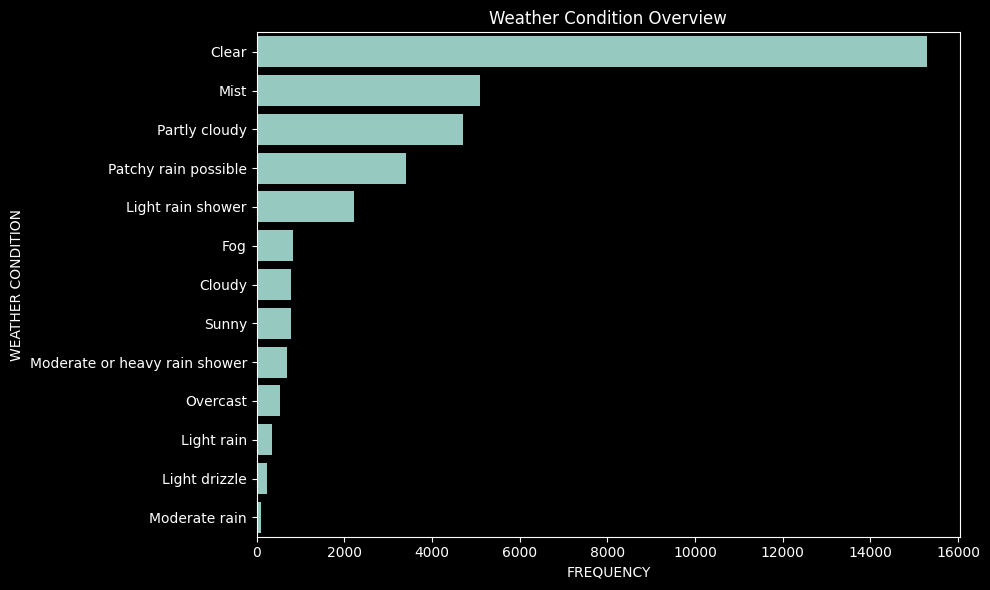

In [23]:
condition_counts = df['condition_text'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=condition_counts.values, y=condition_counts.index)
plt.title('Weather Condition Overview')
plt.xlabel('FREQUENCY')
plt.ylabel('WEATHER CONDITION')
plt.xticks(rotation=720)
plt.tight_layout()
plt.show()

In [24]:
df.head()

,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,wind_direction,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,final_air_quality_index
0,Ashoknagar,Madhya Pradesh,24.57,77.72,Kolkata,27.5,Partly cloudy,20.5,281,WNW,...,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2,39.010
1,Raisen,Madhya Pradesh,23.33,77.80,Kolkata,27.5,Sunny,15.5,287,WNW,...,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1,36.150
2,Chhindwara,Madhya Pradesh,22.07,78.93,Kolkata,26.3,Partly cloudy,18.4,317,NW,...,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2,39.655
3,Betul,Madhya Pradesh,21.86,77.93,Kolkata,25.6,Cloudy,16.9,297,WNW,...,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1,27.195
4,Hoshangabad,Madhya Pradesh,22.75,77.72,Kolkata,27.2,Cloudy,16.2,274,W,...,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1,36.450


NOW TO PLOT A HEATMAP , WE NEED TO DROP THE COLUMNS WHICH CONSISTS OF THE STRING VALUES SO THAT IT DOESNT GIVES US AN ERROR

In [25]:
df_copy = df.copy()
df_copy.drop(['location_name' , 'region' , 'timezone' , 'condition_text' , 'wind_direction'] , axis=1 , inplace=True)

<Figure size 2000x2000 with 0 Axes>

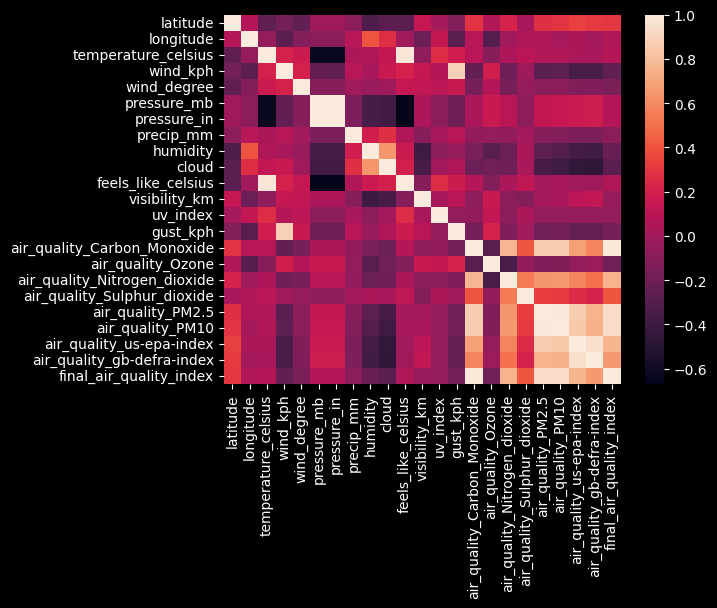

<Figure size 2000x2000 with 0 Axes>

In [26]:
sns.heatmap(df_copy.corr())
plt.figure(figsize=(20,20))

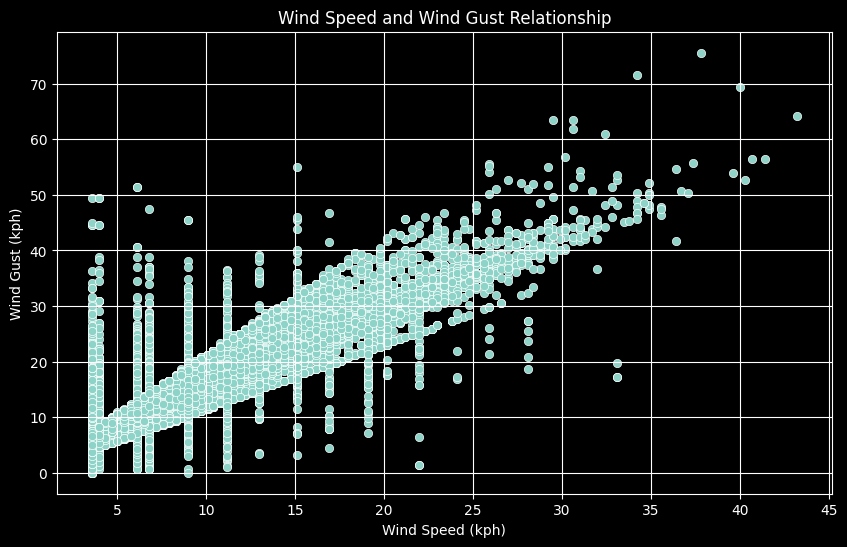

In [27]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='wind_kph', y='gust_kph')
plt.title('Wind Speed and Wind Gust Relationship')
plt.xlabel('Wind Speed (kph)')
plt.ylabel('Wind Gust (kph)')
plt.grid()
plt.show()

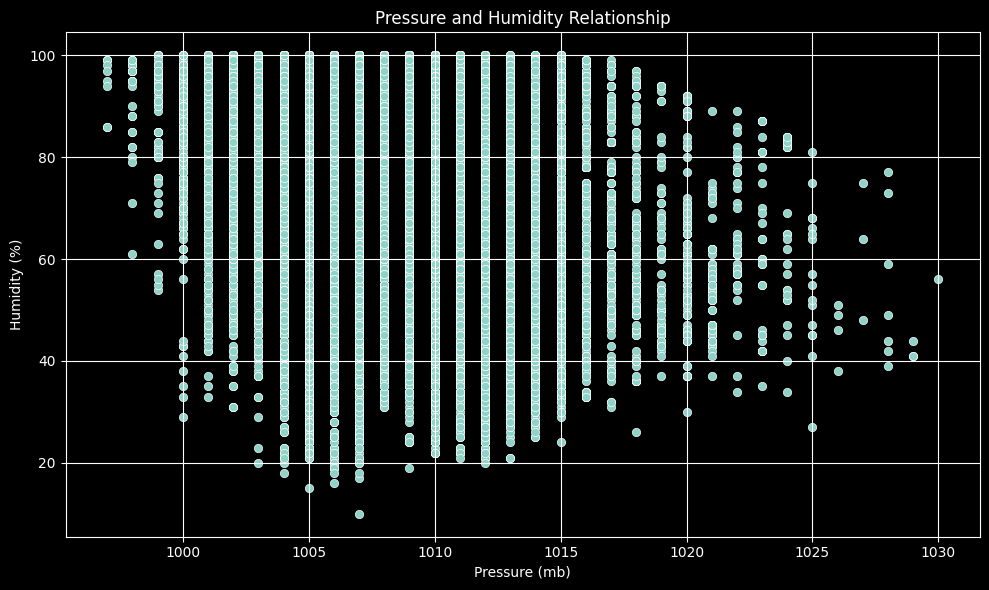

In [28]:
#RELATION BETWEEN PRESSURE AND HUMIDITY


plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='pressure_mb', y='humidity')
plt.title('Pressure and Humidity Relationship')
plt.xlabel('Pressure (mb)')
plt.ylabel('Humidity (%)')
plt.grid()
plt.tight_layout()
plt.show()

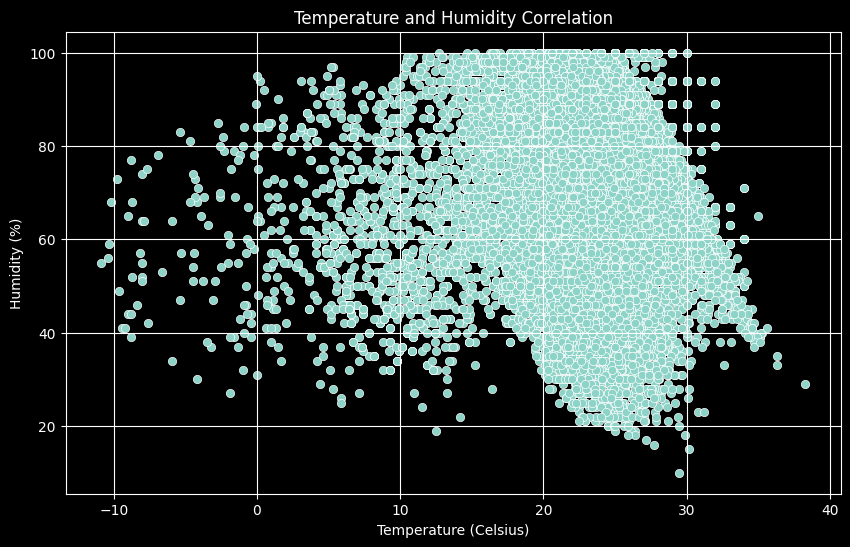

In [29]:
#RELATION BETWEEN TEMP AND HUMIDITY

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='temperature_celsius', y='humidity')
plt.title('Temperature and Humidity Correlation')
plt.xlabel('Temperature (Celsius)')
plt.ylabel('Humidity (%)')
plt.grid()
plt.show()

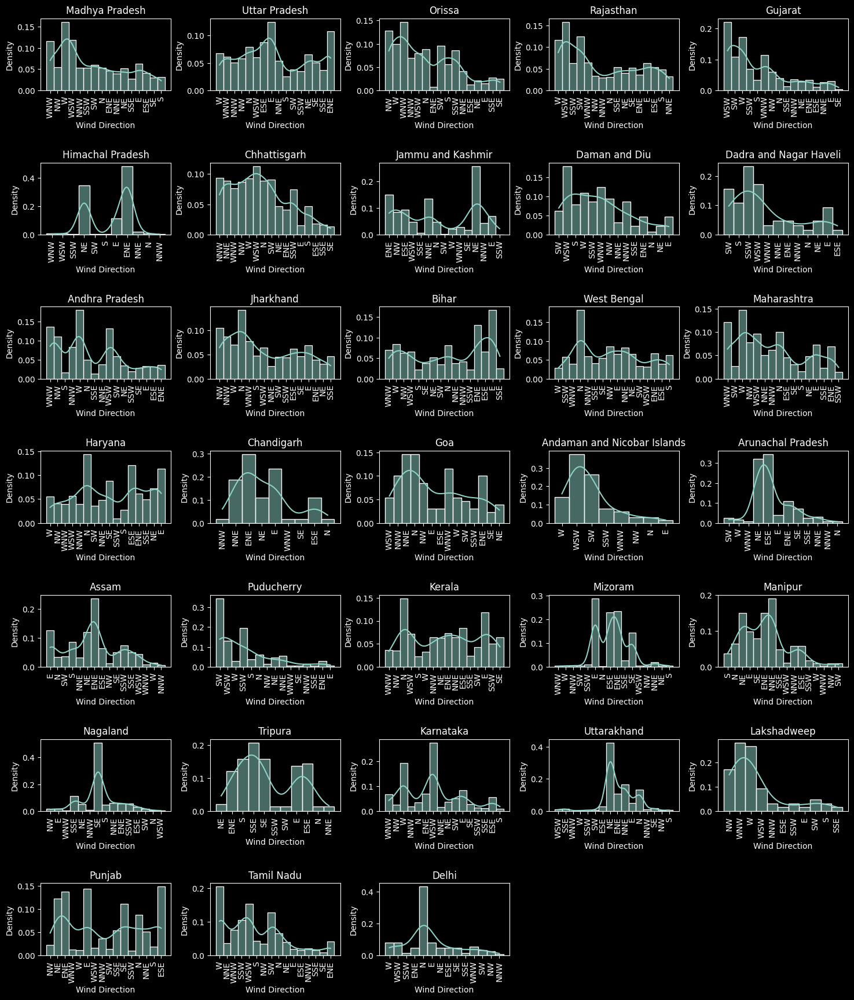

In [30]:
regions = df['region'].unique()
num_cols = 5 
num_rows = (len(regions) + num_cols - 1) // num_cols 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 3 * num_rows))
fig.subplots_adjust(hspace=1, wspace=0.3)  
for i, region in enumerate(regions):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    data_subset = df[df['region'] == region]
    sns.histplot(data=data_subset, x='wind_direction', bins=16, multiple='stack', stat='density', ax=ax ,kde=True)
    ax.set_title(f'{region}')
    ax.set_xlabel('Wind Direction')
    ax.set_ylabel('Density')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
if len(regions) % num_cols != 0:
    for i in range(len(regions), num_rows * num_cols):
        fig.delaxes(axes[i // num_cols, i % num_cols])

plt.show()

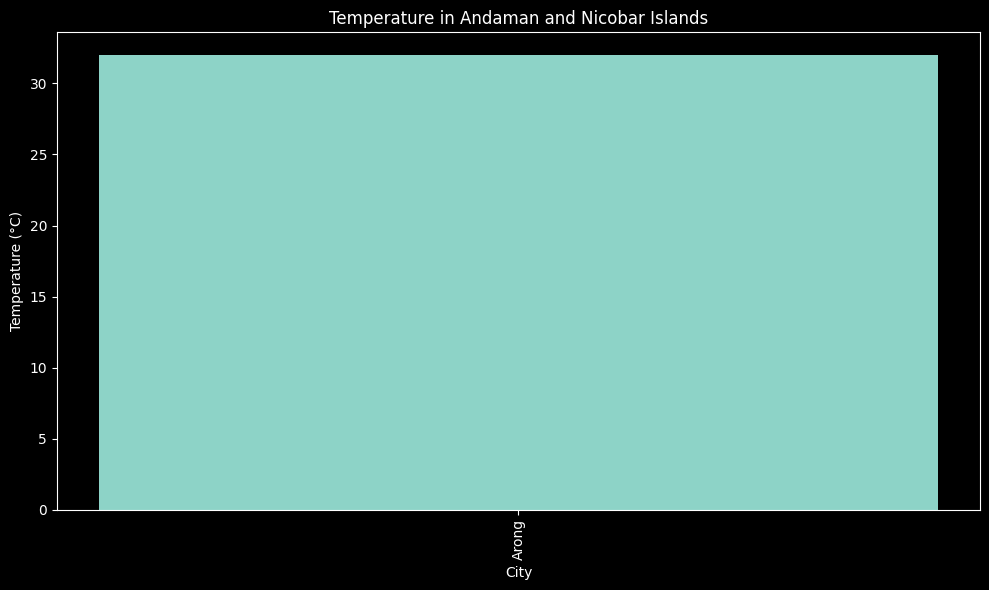

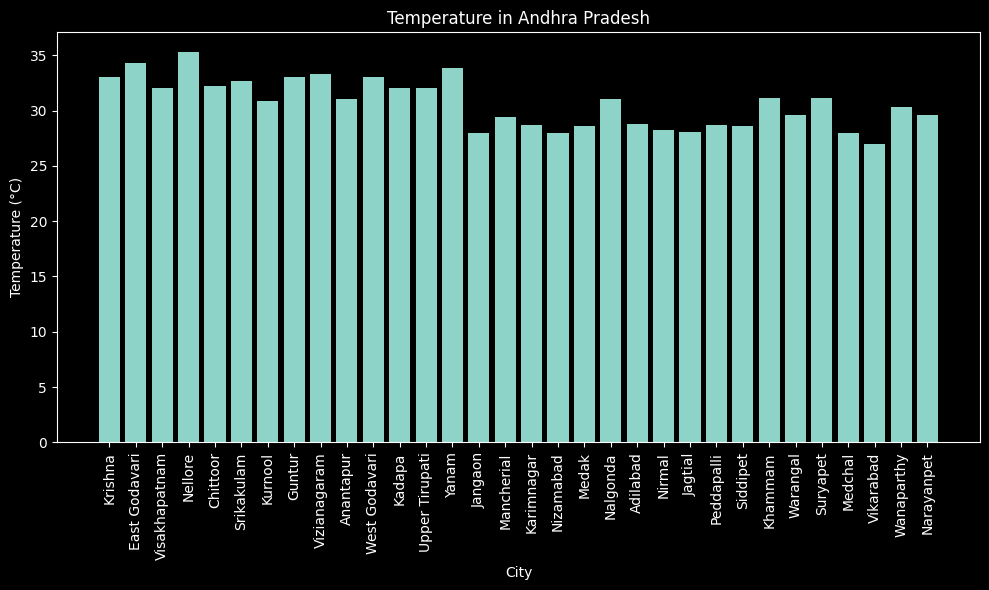

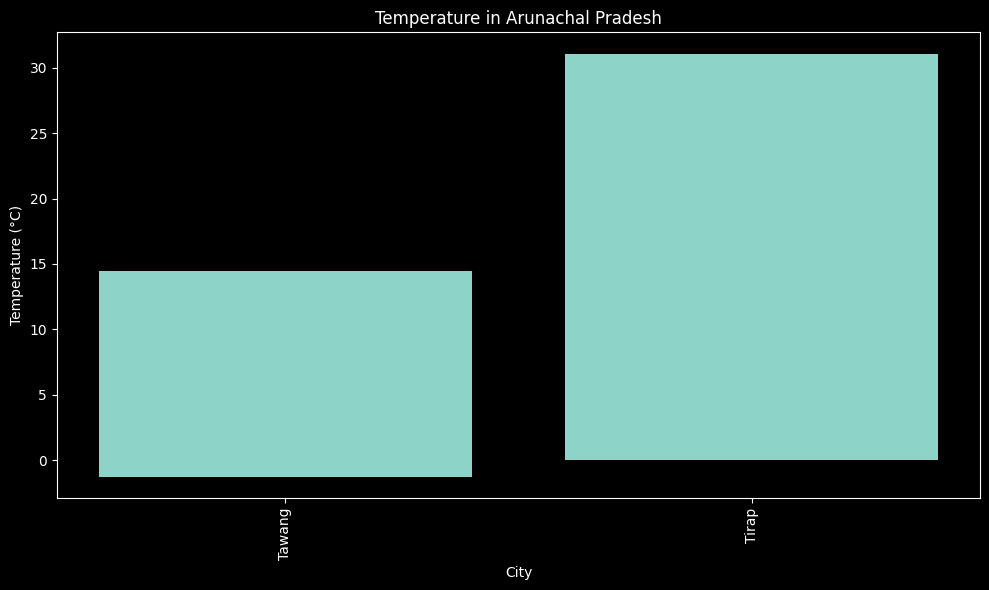

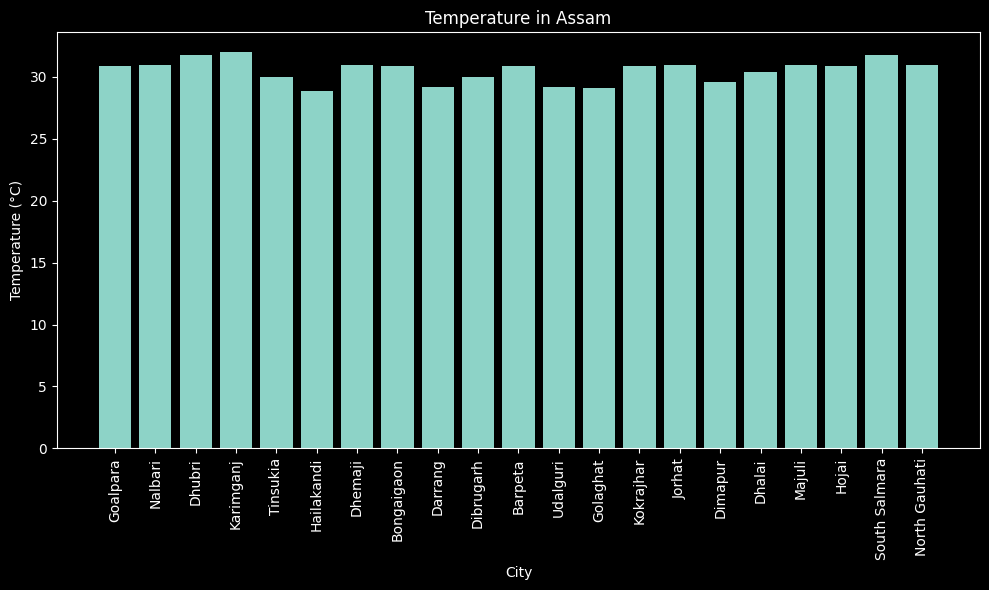

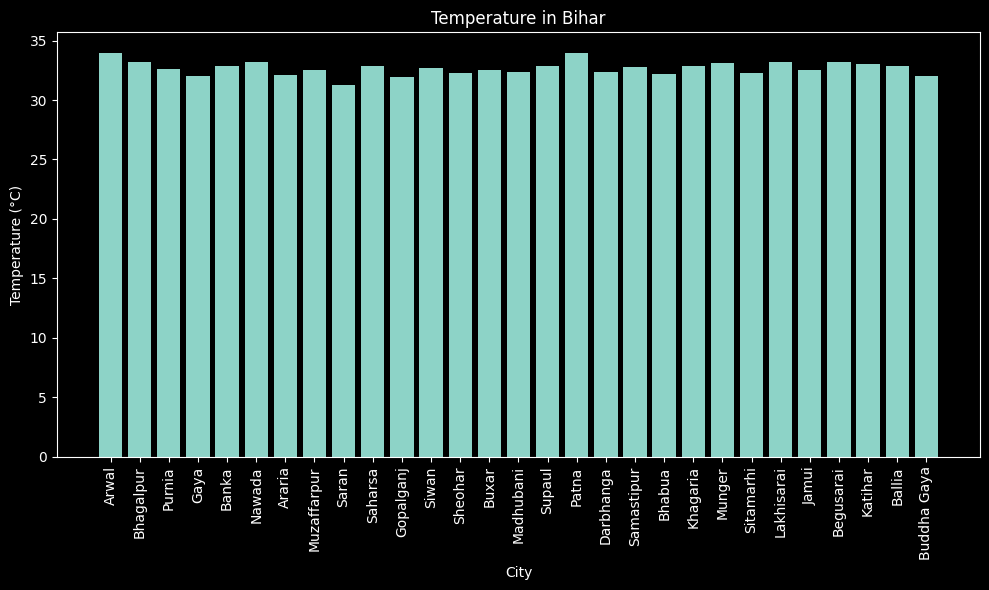

...

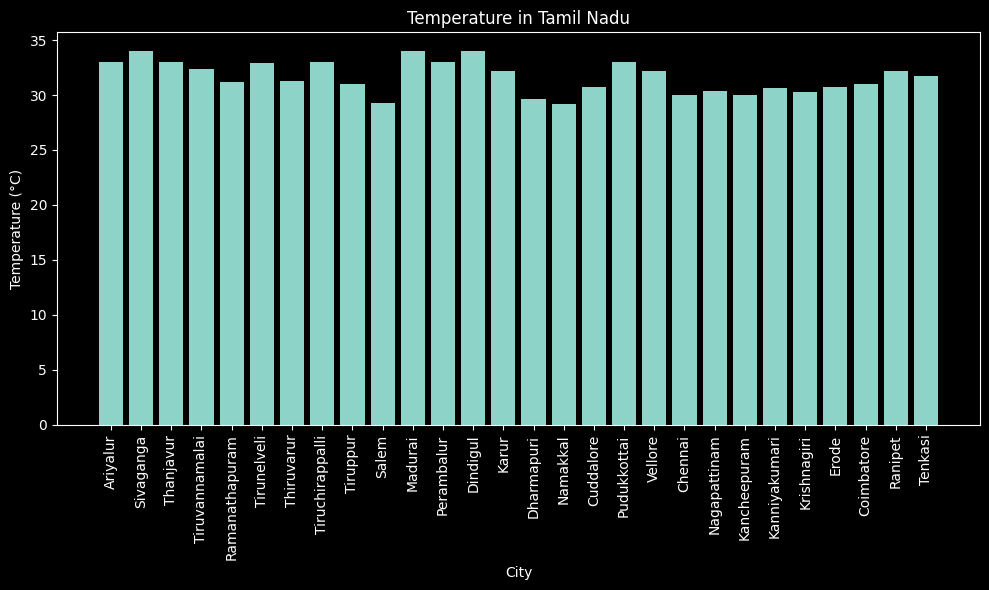

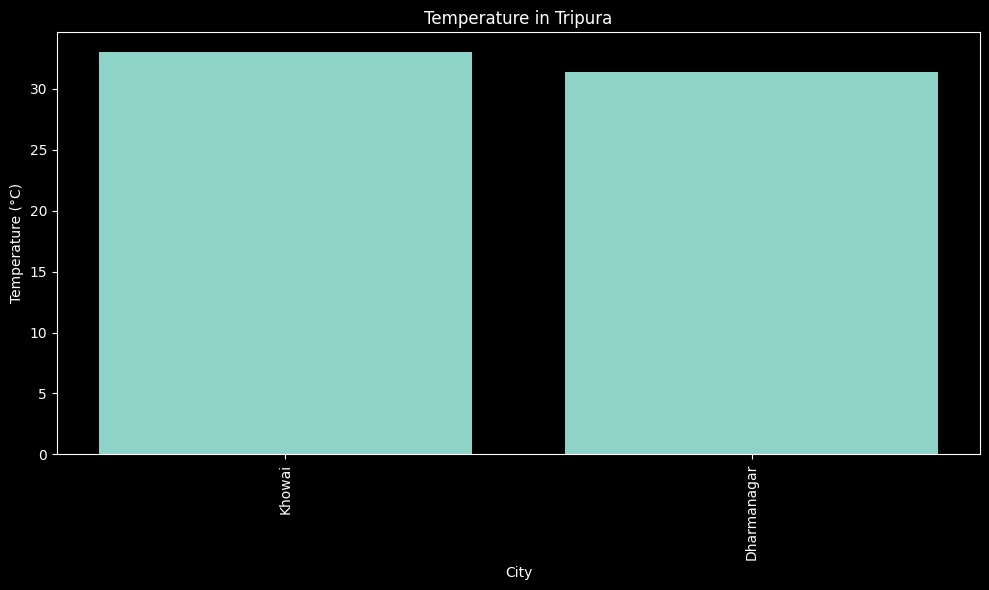

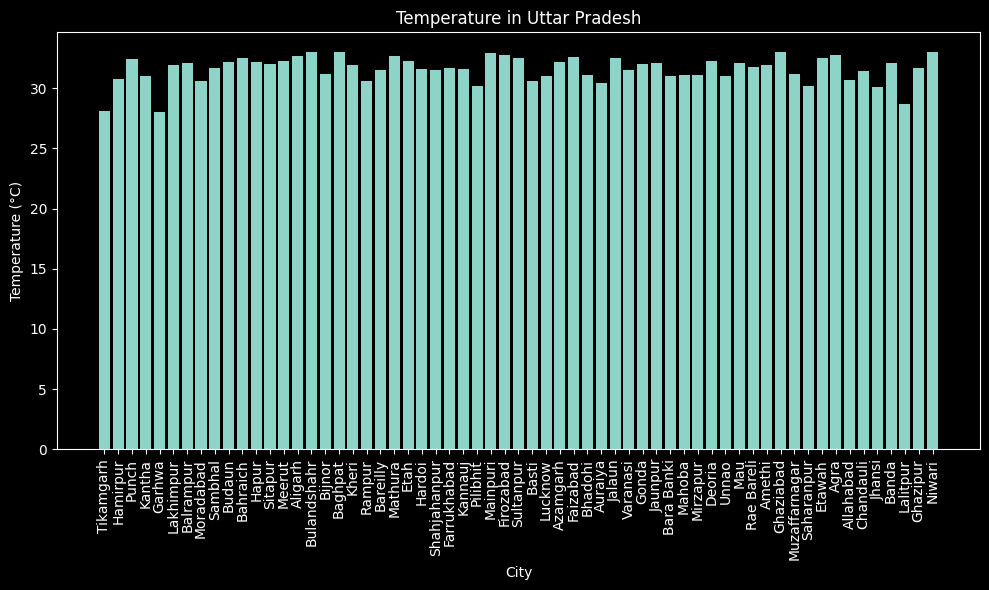

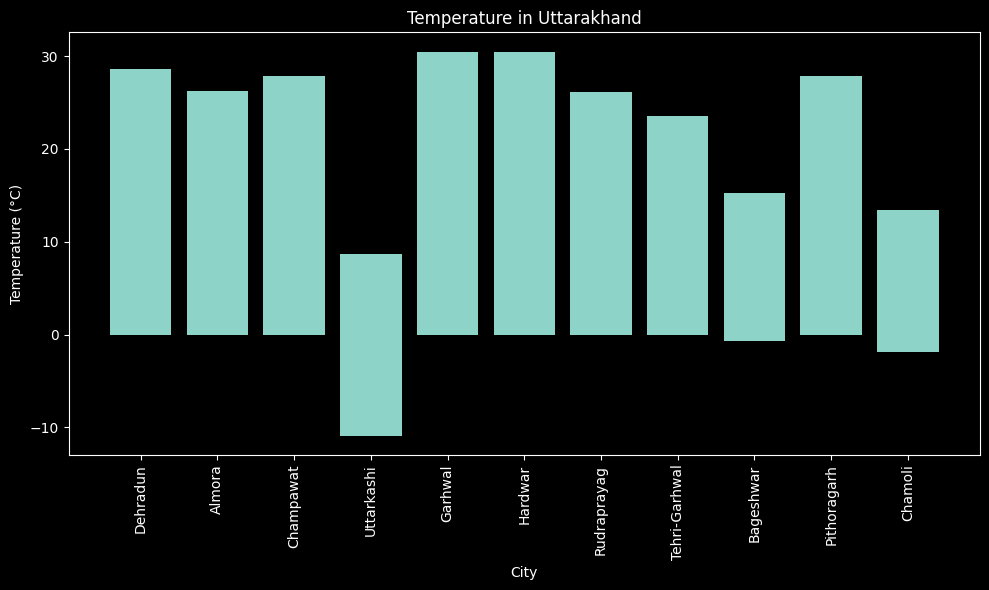

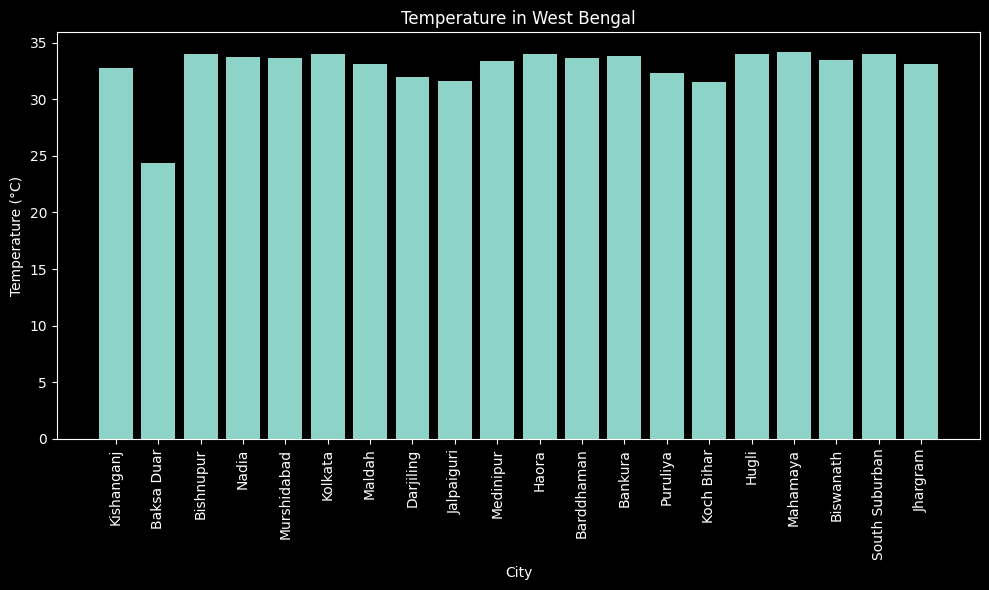

In [31]:
for state, group in df.groupby('region'):
    plt.figure(figsize=(10, 6))
    plt.bar(group['location_name'], group['temperature_celsius'])
    plt.xlabel('City')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Temperature in {state}')
    plt.xticks(rotation=90)  
    plt.tight_layout()


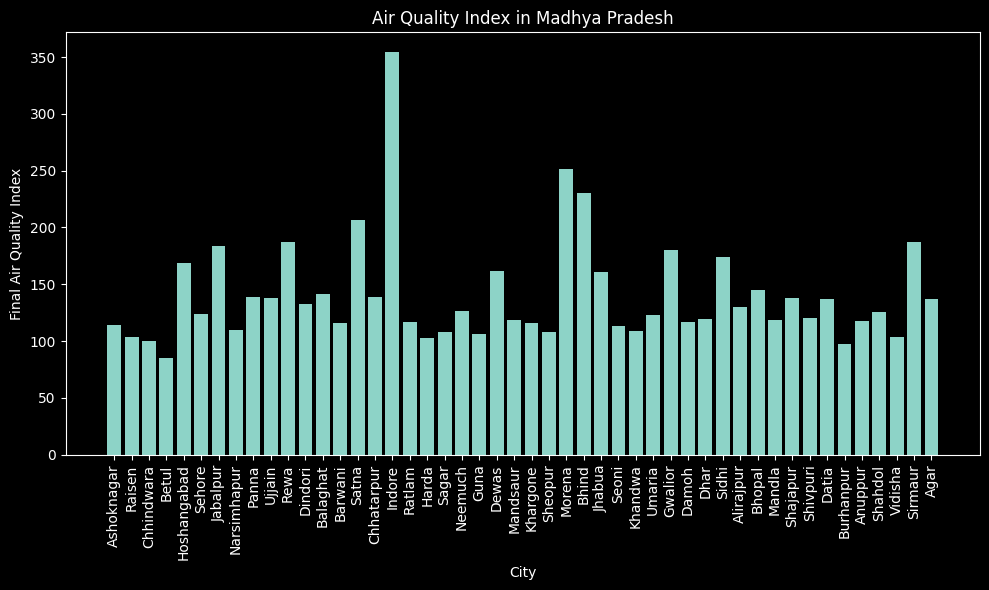

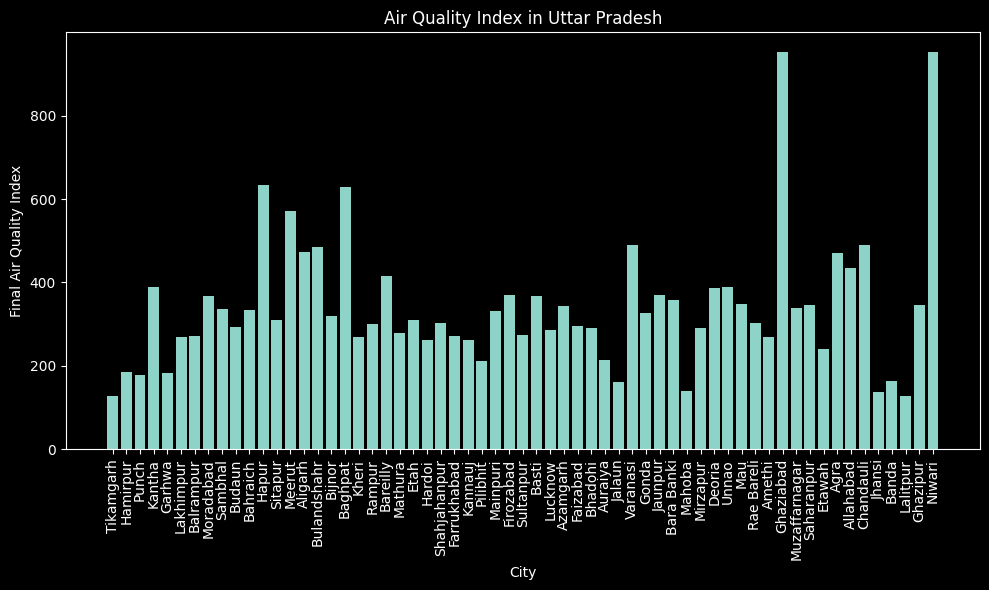

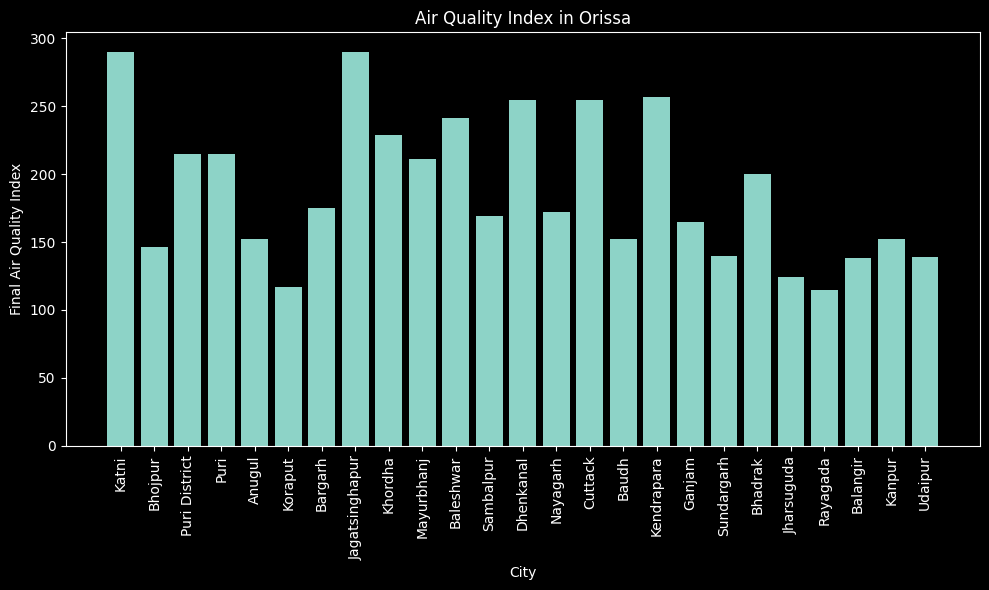

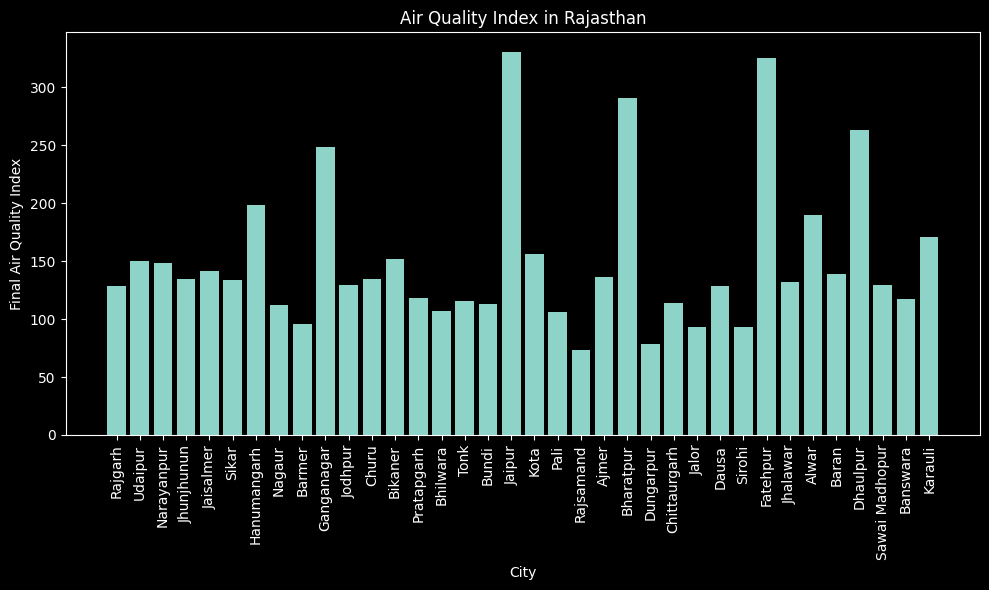

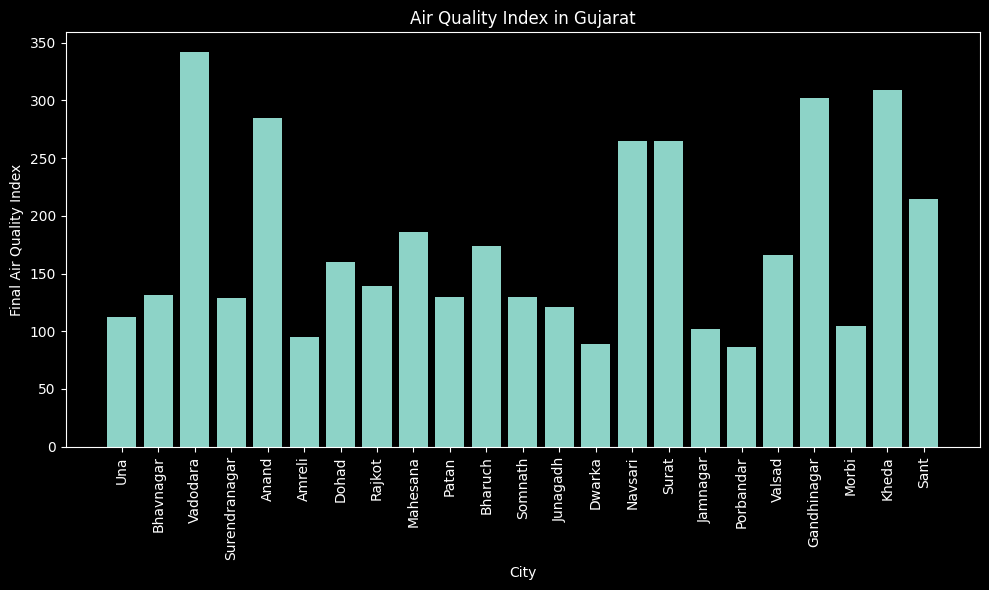

...

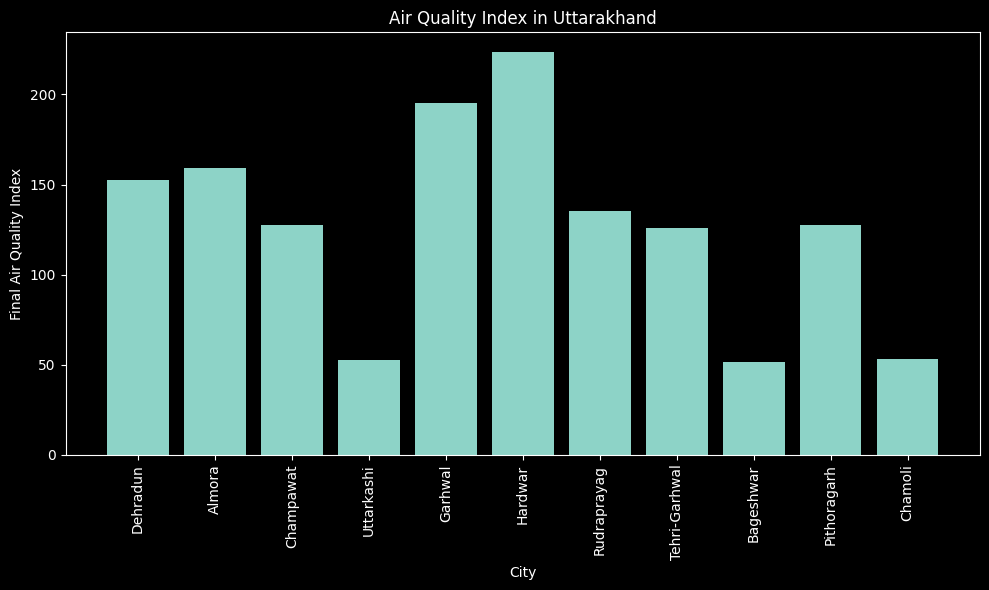

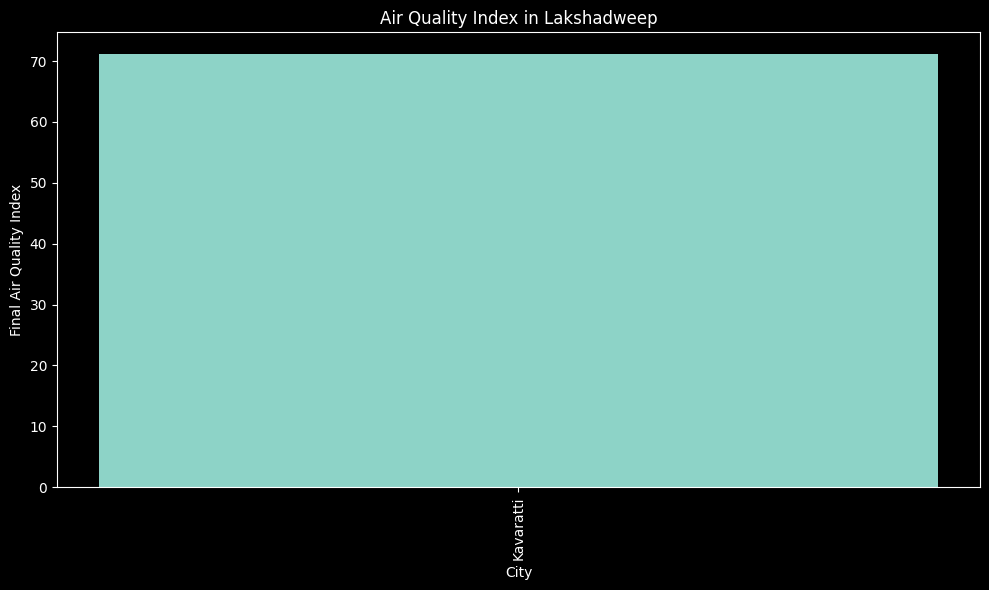

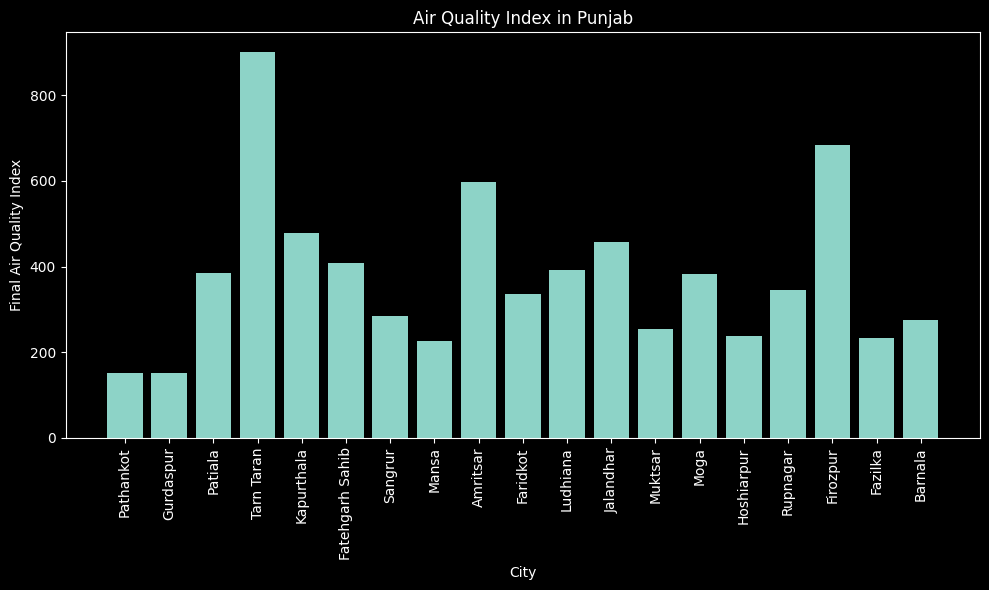

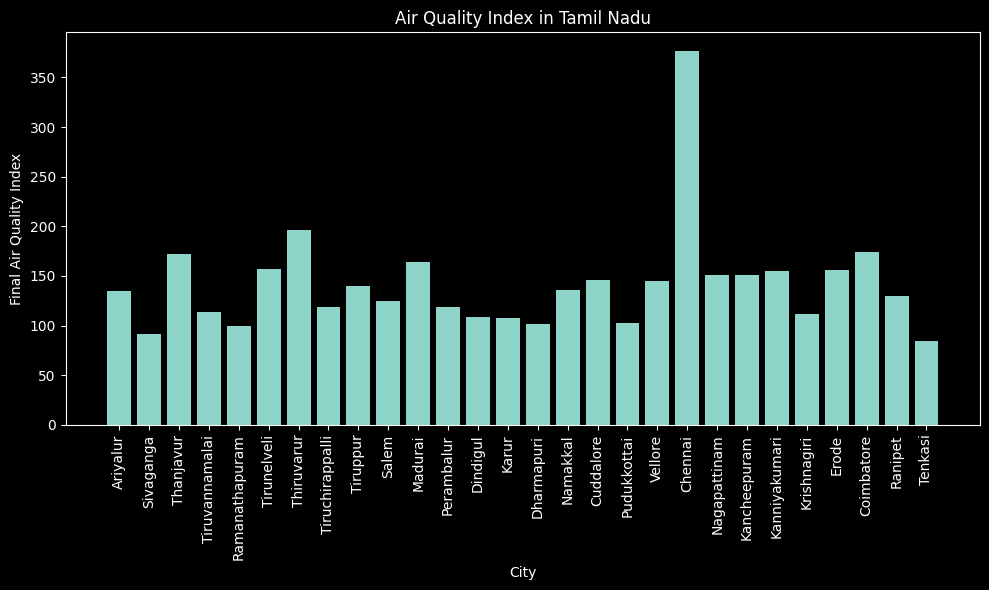

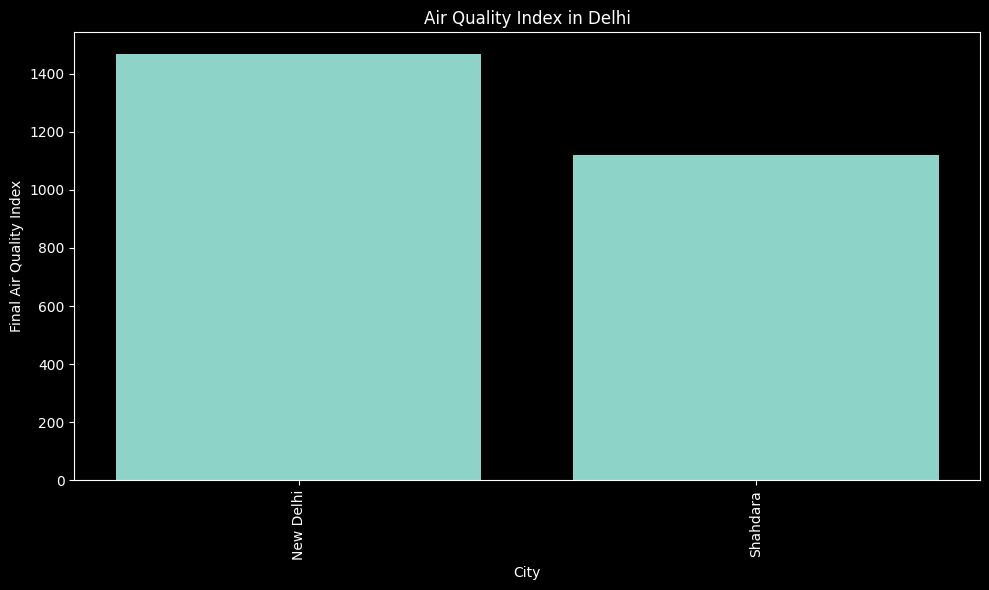

In [32]:
states = df['region'].unique()
for state in states:
    group = df[df['region'] == state]
    plt.figure(figsize=(10, 6))
    plt.bar(group['location_name'], group['final_air_quality_index'])
    plt.xlabel('City')
    plt.ylabel('Final Air Quality Index')
    plt.title(f'Air Quality Index in {state}')
    plt.xticks(rotation=90)  
    plt.tight_layout()

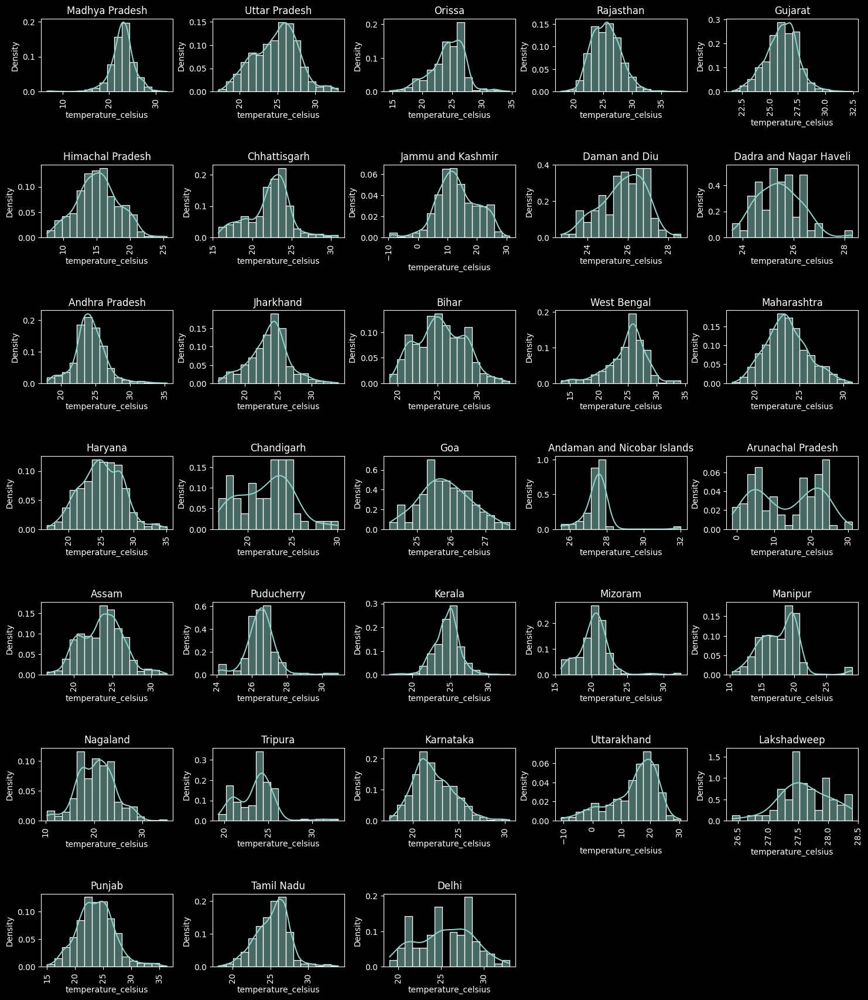

In [33]:
regions = df['region'].unique()
num_cols = 5 
num_rows = (len(regions) + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 3 * num_rows))
fig.subplots_adjust(hspace=1, wspace=0.3)  
for i, region in enumerate(regions):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    data_subset = df[df['region'] == region]
    sns.histplot(data=data_subset, x='temperature_celsius', bins=16, multiple='stack', stat='density', ax=ax , kde=True)
    ax.set_title(f'{region}')
    ax.set_xlabel('temperature_celsius')
    ax.set_ylabel('Density')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
if len(regions) % num_cols != 0:
    for i in range(len(regions), num_rows * num_cols):
        fig.delaxes(axes[i // num_cols, i % num_cols])

plt.show()

In [34]:
df['location_name'].value_counts().sum()

35014

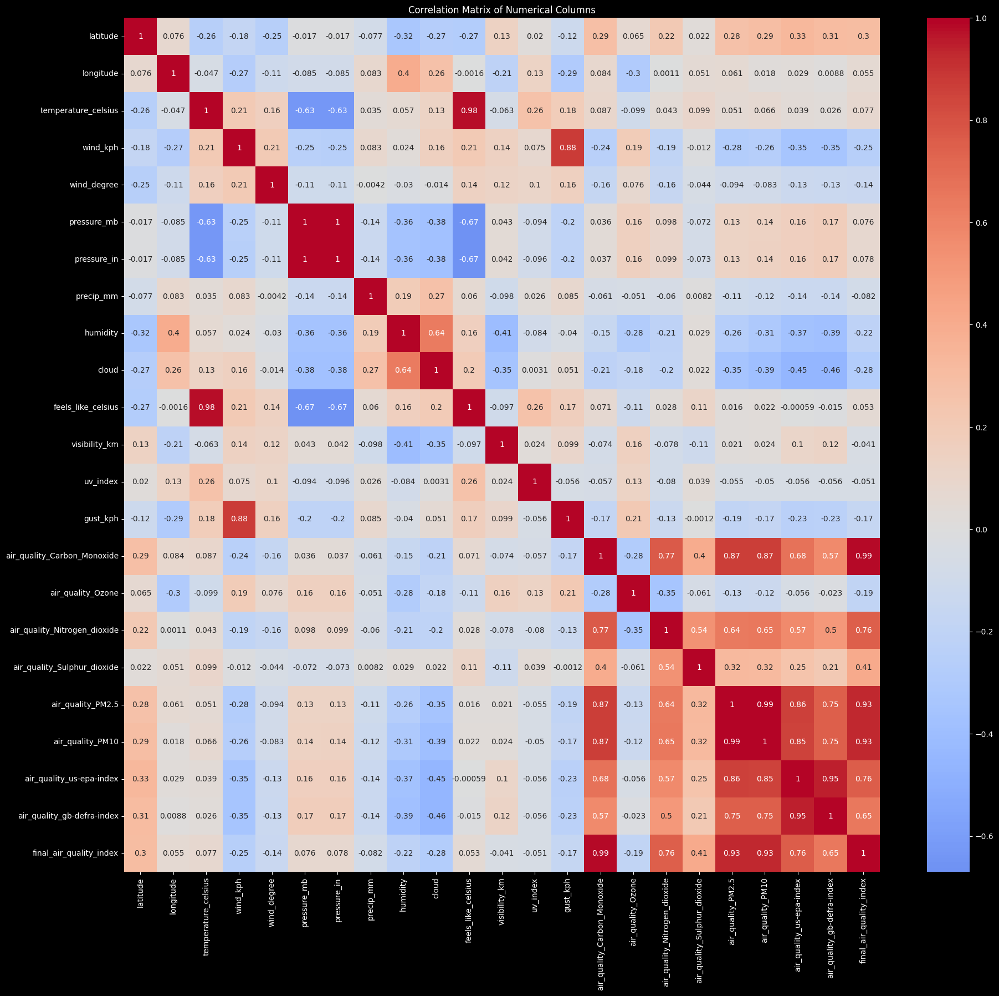

In [35]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numerical_columns].corr()
plt.figure(figsize=(22, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

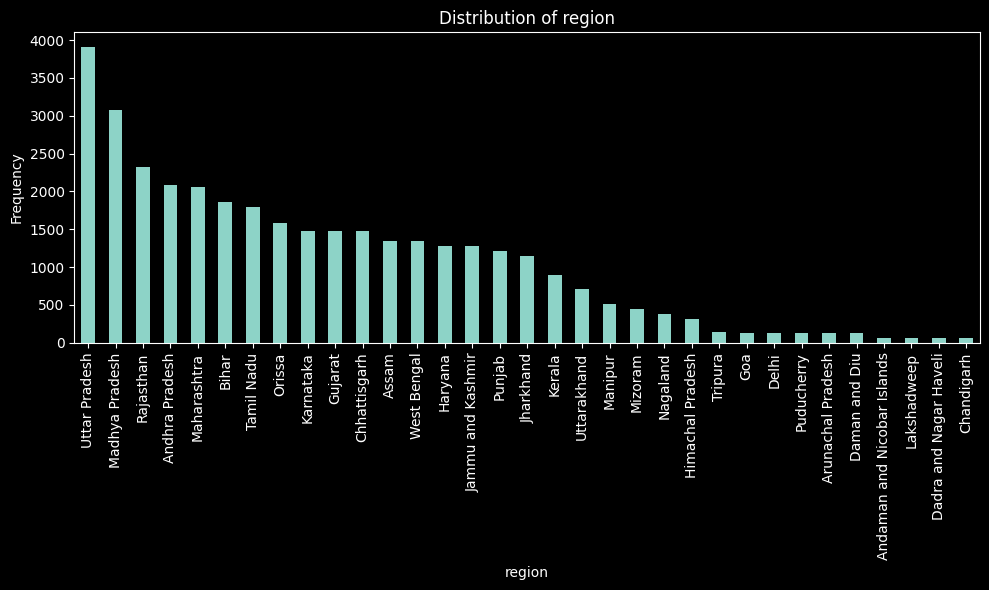

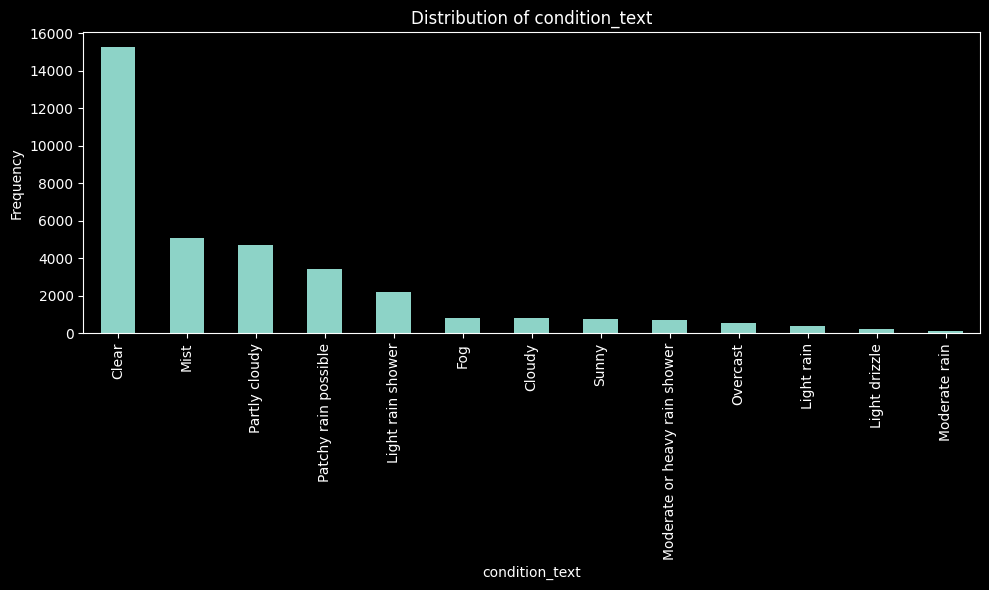

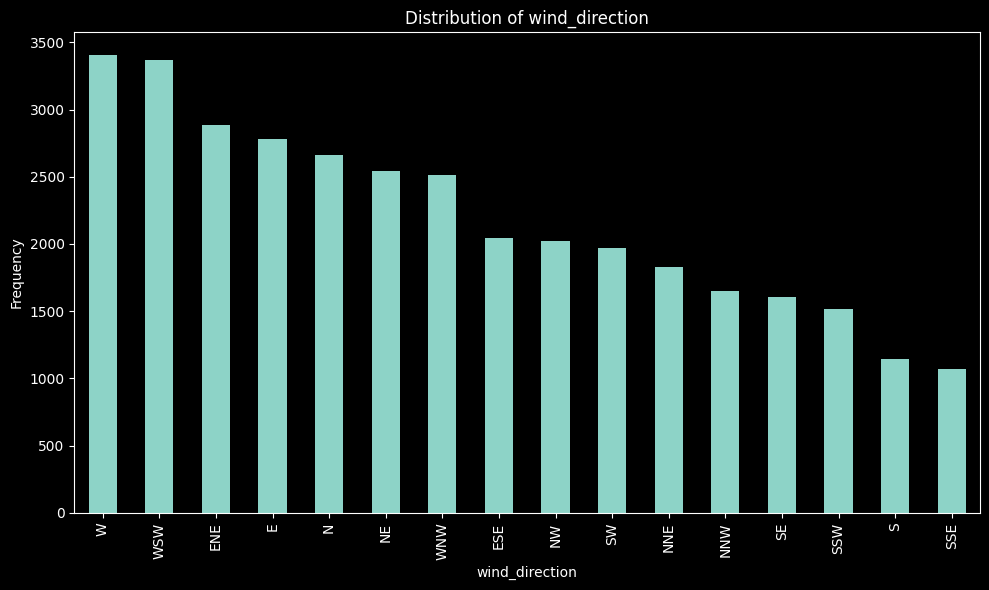

In [36]:
# List of columns you want to visualize
columns_to_visualize = ['region', 'condition_text','wind_direction']  # Add more columns as needed

# Loop through each column and create bar plots
for column in columns_to_visualize:
    plt.figure(figsize=(10, 6))
    df[column].value_counts().plot(kind='bar')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

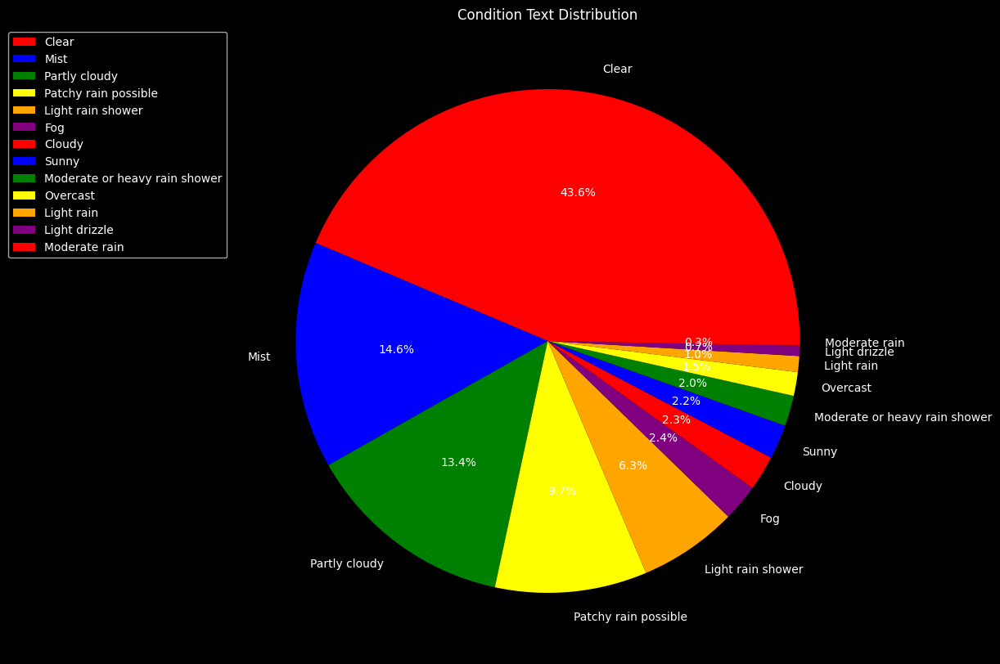

In [37]:
plt.figure(figsize=(10,10))
colors = ['red', 'blue', 'green', 'yellow', 'orange', 'purple']
plt.pie(df['condition_text'].value_counts(), labels=df['condition_text'].value_counts().index, colors=colors, autopct='%1.1f%%')
plt.title('Condition Text Distribution')
plt.legend(loc='upper right', bbox_to_anchor=(0, 1))
plt.show()


In [38]:
import folium
from folium.plugins import HeatMap
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=5)
heat_data = [[row['latitude'], row['longitude'], row['temperature_celsius']] for index, row in df.iterrows()]
HeatMap(heat_data, radius=15).add_to(m)
m.save('temperature_heatmap.html')
m

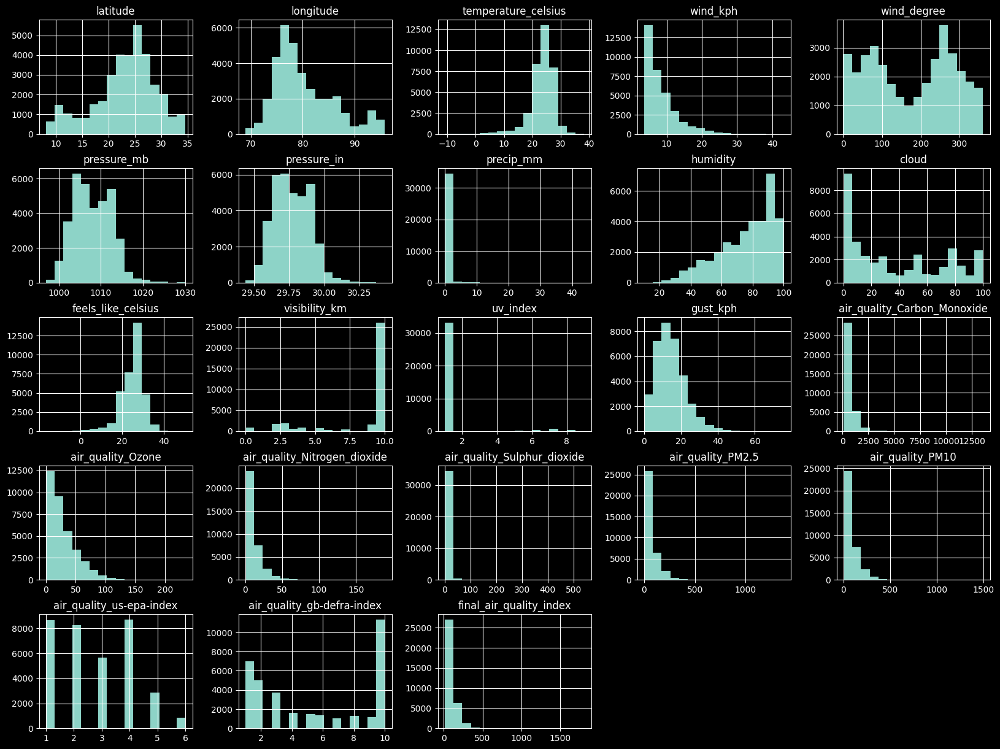

In [39]:
df.hist(bins=16, figsize=(20,15));

# Which state causes the most pollution

In [40]:
import plotly.express as px
air_quality_metrics = ['air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10']

for metric in air_quality_metrics:
    fig = px.scatter(df, x='temperature_celsius', y=metric, title=f'Temperature vs {metric}')
    fig.show()

In [41]:
# Which state causes the most pollution (PM2.5 = the metric)


most_polluting_state = df.groupby('region')['final_air_quality_index'].mean().idxmax()
fig = px.bar(df.groupby('region')['final_air_quality_index'].mean().reset_index(), x='region', y='final_air_quality_index', title='Average AIR Quality by State')
fig.show()
print(f"The most polluting state is {most_polluting_state}")

The most polluting state is Delhi


PRESSURE AND CLOUD RELATION 

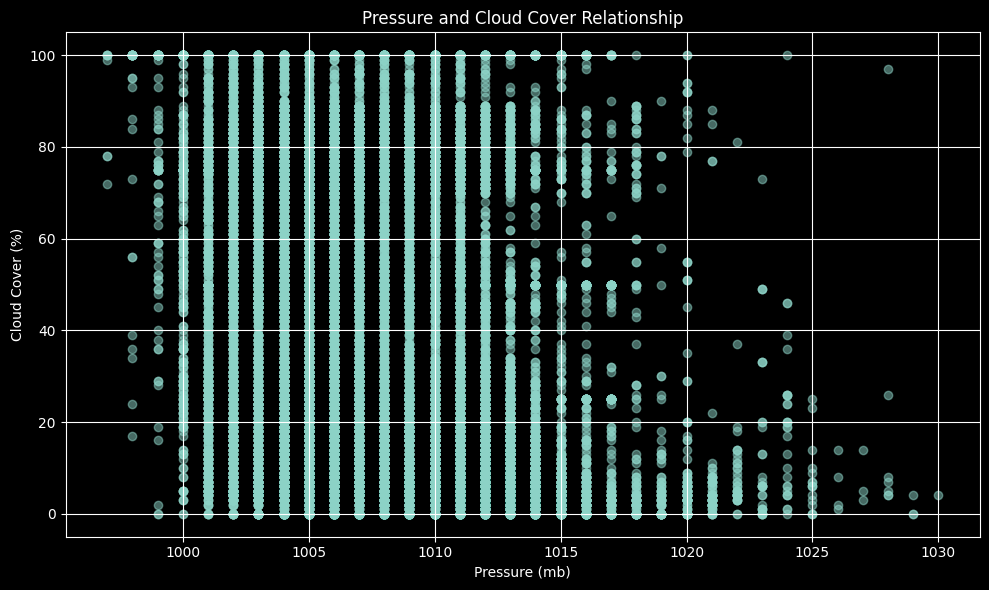

In [42]:
plt.figure(figsize=(10, 6))
plt.scatter(df['pressure_mb'], df['cloud'], alpha=0.5)
plt.title('Pressure and Cloud Cover Relationship')
plt.xlabel('Pressure (mb)')
plt.ylabel('Cloud Cover (%)')
plt.grid()
plt.tight_layout()
plt.show()

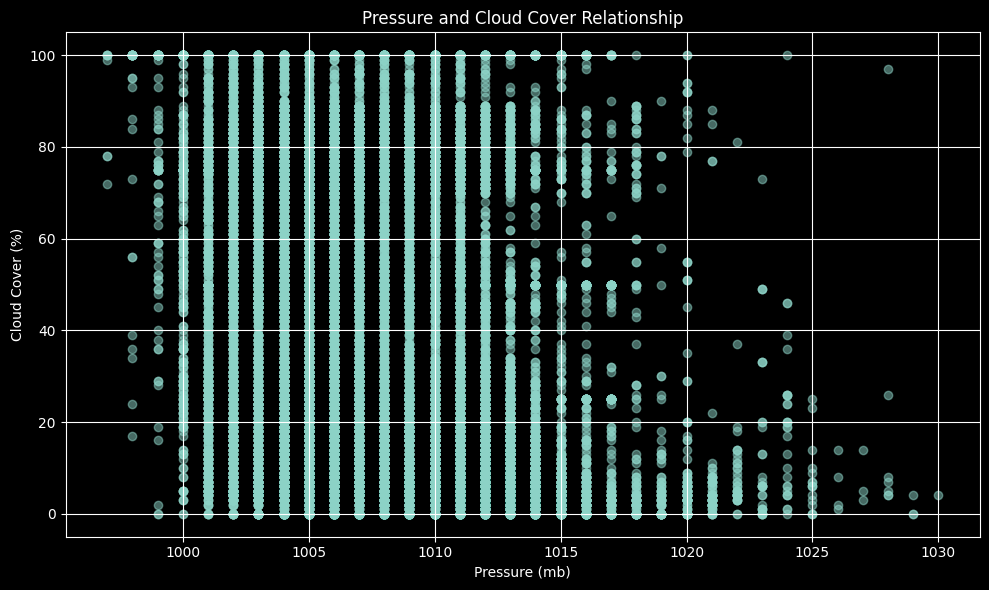

In [43]:
plt.figure(figsize=(10, 6))
plt.scatter(df['pressure_mb'], df['cloud'], alpha=0.5)
plt.title('Pressure and Cloud Cover Relationship')
plt.xlabel('Pressure (mb)')
plt.ylabel('Cloud Cover (%)')
plt.grid()
plt.tight_layout()
plt.show()

<Figure size 1200x1000 with 0 Axes>

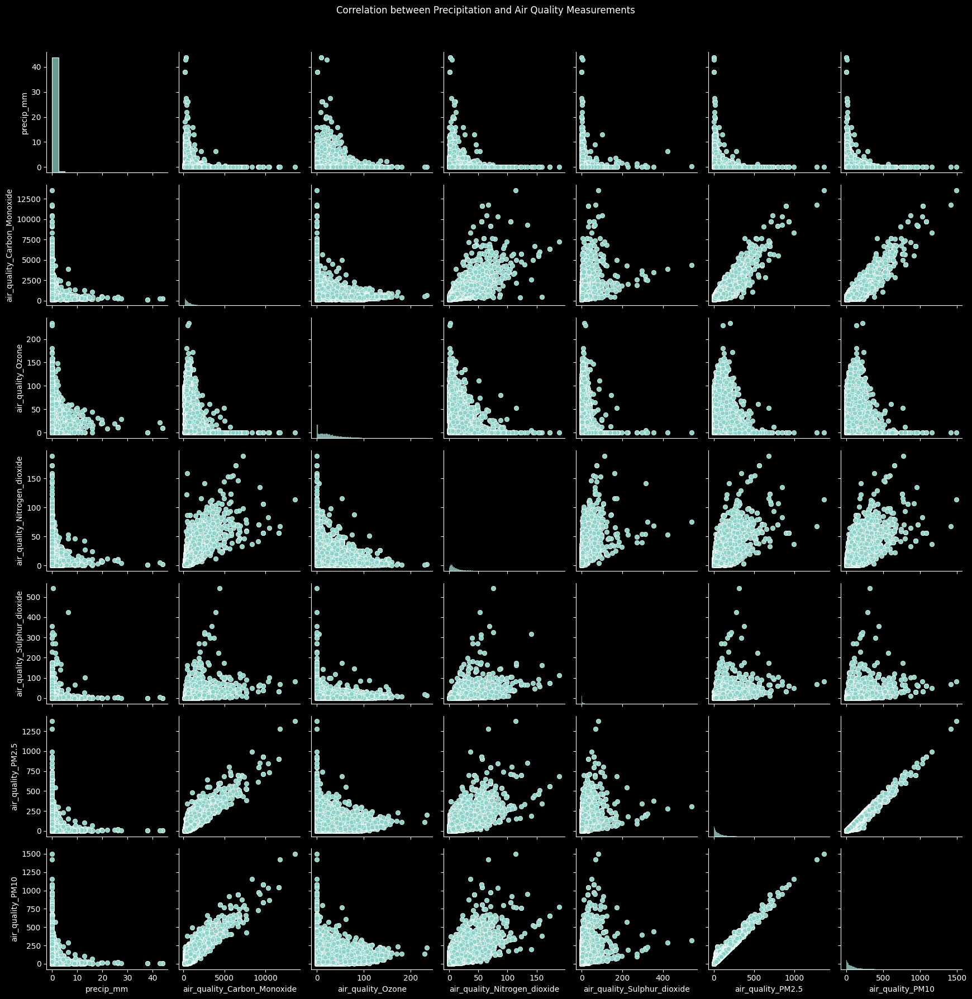

In [44]:
# Selecting the relevant columns for the pair plot
pair_columns = ['precip_mm', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 
                'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide', 
                'air_quality_PM2.5', 'air_quality_PM10']

plt.figure(figsize=(12, 10))
sns.pairplot(data=df[pair_columns])
plt.suptitle('Correlation between Precipitation and Air Quality Measurements', y=1.02)
plt.tight_layout()
plt.show()

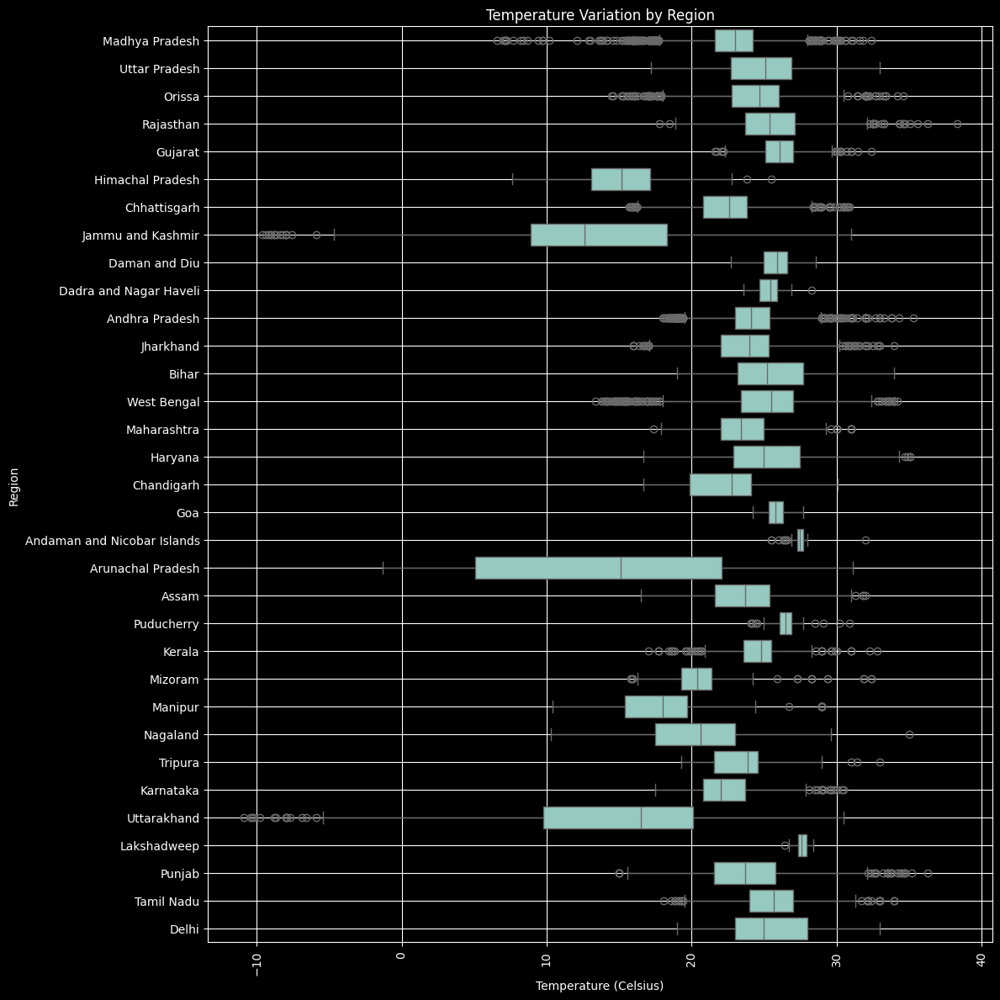

In [45]:
plt.figure(figsize=(12, 12))
sns.boxplot(data=df, x='temperature_celsius', y='region')
plt.title('Temperature Variation by Region')
plt.xlabel('Temperature (Celsius)')
plt.ylabel('Region')
plt.xticks(rotation=90)
plt.grid()
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


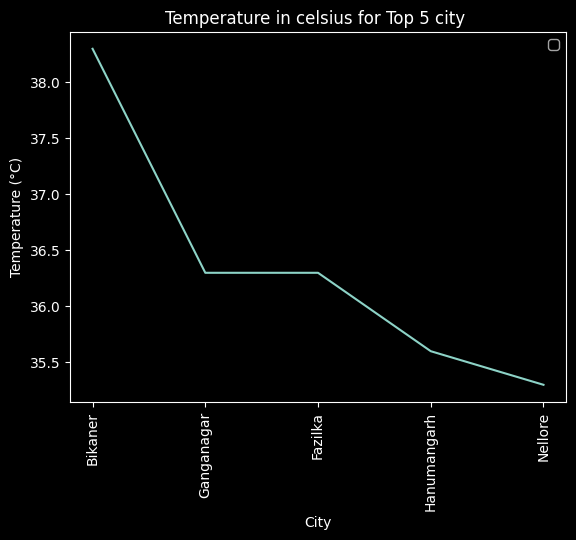

In [46]:
df_copy = df.copy()
df_copy = df_copy.sort_values(by='temperature_celsius', ascending=False)
highest_temp_row = df_copy.iloc[0]
location_name = highest_temp_row['location_name']
region = highest_temp_row['region']
timezone = highest_temp_row['timezone']
temp_celsius = highest_temp_row['temperature_celsius']
location = df_copy['location_name'].head(5)
temps_celsius = df_copy['temperature_celsius'].head(5)
plt.plot(location,temps_celsius)
plt.title('Temperature in celsius for Top 5 city ')
plt.xlabel('City')
plt.ylabel('Temperature (°C)')
plt.xticks(rotation=90)
plt.legend()
plt.show()

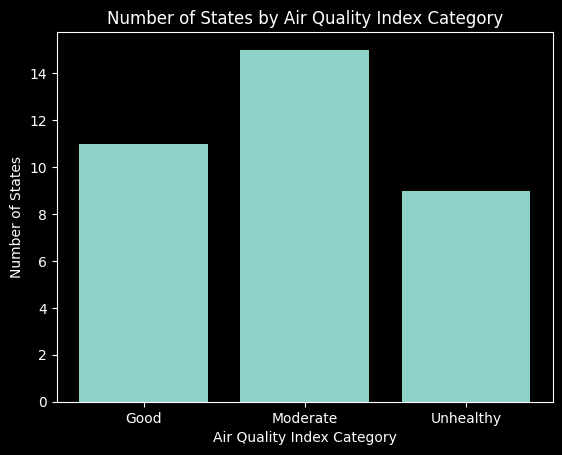

In [47]:
good_aqi = range(0, 51)
moderate_aqi = range(51, 101)
unhealthy_aqi = range(101, 151)
good_states = len(df[df['final_air_quality_index'].isin(good_aqi)]['region'].unique())
moderate_states = len(df[df['final_air_quality_index'].isin(moderate_aqi)]['region'].unique())
unhealthy_states = len(df[df['final_air_quality_index'].isin(unhealthy_aqi)]['region'].unique())
plt.bar(['Good', 'Moderate', 'Unhealthy'], [good_states, moderate_states, unhealthy_states]  )
plt.title('Number of States by Air Quality Index Category')
plt.xlabel('Air Quality Index Category')
plt.ylabel('Number of States')
plt.show()

# IMPLEMENTING VARIOUS MACHINE LEARNING MODELS TO PREDICT VARIOUS COLUMNS 

## LIBRARIES FOR MACHINE LEARNING

In [48]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

In [49]:
df.head()

,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,wind_direction,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,final_air_quality_index
0,Ashoknagar,Madhya Pradesh,24.57,77.72,Kolkata,27.5,Partly cloudy,20.5,281,WNW,...,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2,39.010
1,Raisen,Madhya Pradesh,23.33,77.80,Kolkata,27.5,Sunny,15.5,287,WNW,...,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1,36.150
2,Chhindwara,Madhya Pradesh,22.07,78.93,Kolkata,26.3,Partly cloudy,18.4,317,NW,...,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2,39.655
3,Betul,Madhya Pradesh,21.86,77.93,Kolkata,25.6,Cloudy,16.9,297,WNW,...,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1,27.195
4,Hoshangabad,Madhya Pradesh,22.75,77.72,Kolkata,27.2,Cloudy,16.2,274,W,...,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1,36.450


In [50]:
le=LabelEncoder()
df.location_name=le.fit_transform(df.location_name)
df.region=le.fit_transform(df.region)
df.timezone=le.fit_transform(df.timezone)
df.condition_text=le.fit_transform(df.condition_text)
df.wind_direction=le.fit_transform(df.wind_direction)


In [51]:
df.head()

,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,wind_direction,...,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,final_air_quality_index
0,27,19,24.57,77.72,2,27.5,10,20.5,281,14,...,23.8,243.7,45.8,1.7,3.1,12.6,18.5,1,2,39.010
1,411,19,23.33,77.80,2,27.5,12,15.5,287,14,...,18.0,240.3,38.3,2.1,2.6,10.7,14.2,1,1,36.150
2,106,19,22.07,78.93,2,26.3,10,18.4,317,7,...,21.2,220.3,57.2,0.6,1.7,16.8,20.7,2,2,39.655
3,65,19,21.86,77.93,2,25.6,1,16.9,297,14,...,20.9,200.3,25.0,1.2,1.1,4.9,6.6,1,1,27.195
4,206,19,22.75,77.72,2,27.2,1,16.2,274,13,...,18.7,257.0,30.8,2.2,1.8,11.4,14.8,1,1,36.450


In [52]:
X_train , X_test , y_train , y_test = train_test_split(df.drop('temperature_celsius' , axis=1) , df['temperature_celsius'] , test_size=0.3 , random_state=0)

In [53]:
print("X_train:",X_train.shape)
print("X_test:",X_test.shape)
print("Y_train:",y_train.shape)
print("Y_test:",y_test.shape)

X_train: (24509, 27)
X_test: (10505, 27)
Y_train: (24509,)
Y_test: (10505,)


### MODEL 1 : MULTILINEAR REGRESSIONAL MODEL

In [54]:
linreg=LinearRegression()
linreg.fit(X_train , y_train)
y_pred=linreg.predict(X_test)

linreg_accuracy=r2_score(y_test,y_pred)*100
print(" Accuracy of the model is %.2f" %linreg_accuracy)
print("Coefficients of the model are:",linreg.coef_)


 Accuracy of the model is 97.19
Coefficients of the model are: [-1.77262132e-05  8.30703825e-05 -2.79822184e-02  8.36077150e-04
  2.27376526e-03 -2.69196067e-03 -3.96311327e-03 -5.16313071e-05
  6.63510187e-03  2.78479474e-02 -2.17509099e+00 -2.23833703e-02
 -2.64070986e-02 -8.19150435e-04  7.57093114e-01 -2.03789433e-02
  1.56703107e-02  4.78024255e-03  1.24156433e-04 -4.31895164e-03
 -9.57639170e-03 -2.15676449e-03 -1.25170175e-02  1.43581518e-02
 -3.49742786e-02  1.21639594e-02 -2.75965773e-03]


### MODEL 2 : DECISION TREE BASED REGRESSION

Accuracy of the model is 99.75
Mean Square Error: 0.04692622560685388


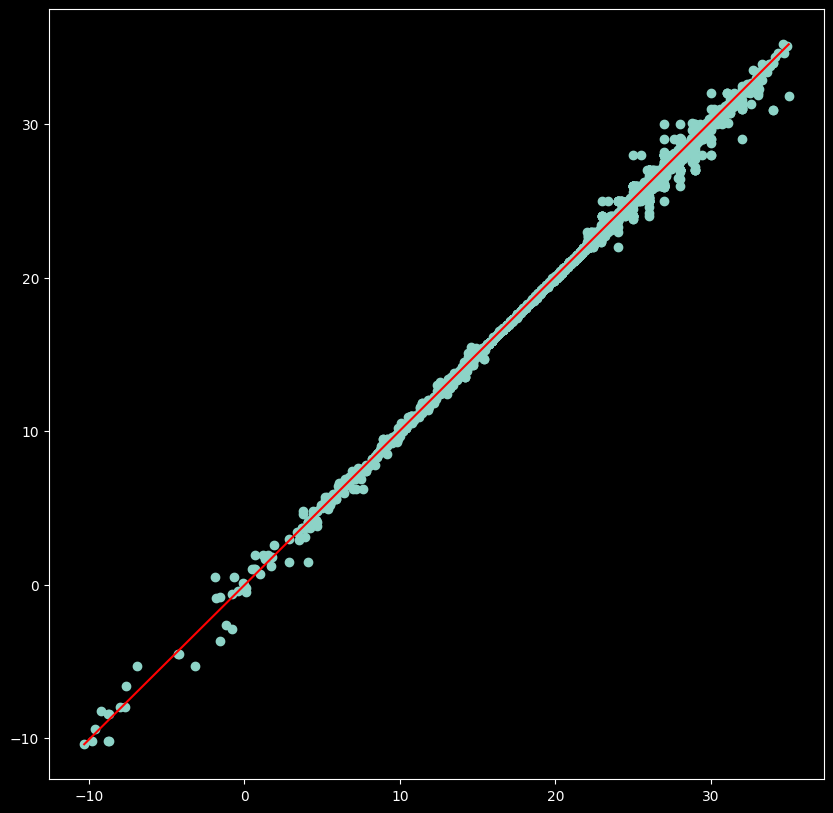

In [55]:
dectree=DecisionTreeRegressor(random_state=0)
dectree.fit(X_train , y_train)
dec_pred=dectree.predict(X_test)

model_accuracy=r2_score(y_test,dec_pred)*100
print("Accuracy of the model is %.2f" %model_accuracy)
mse = np.mean((dec_pred - y_test)**2)
print("Mean Square Error:",mse)
plt.figure(figsize=(10,10))
plt.scatter(y_test,dec_pred)
plt.plot([min(y_test),max(y_test)],[min(dec_pred),max(dec_pred)],color='red')

### MODEL 3 : RANDOM FOREST 

Accuracy of the model is 99.88
Mean Square Error: 0.022137966492146575


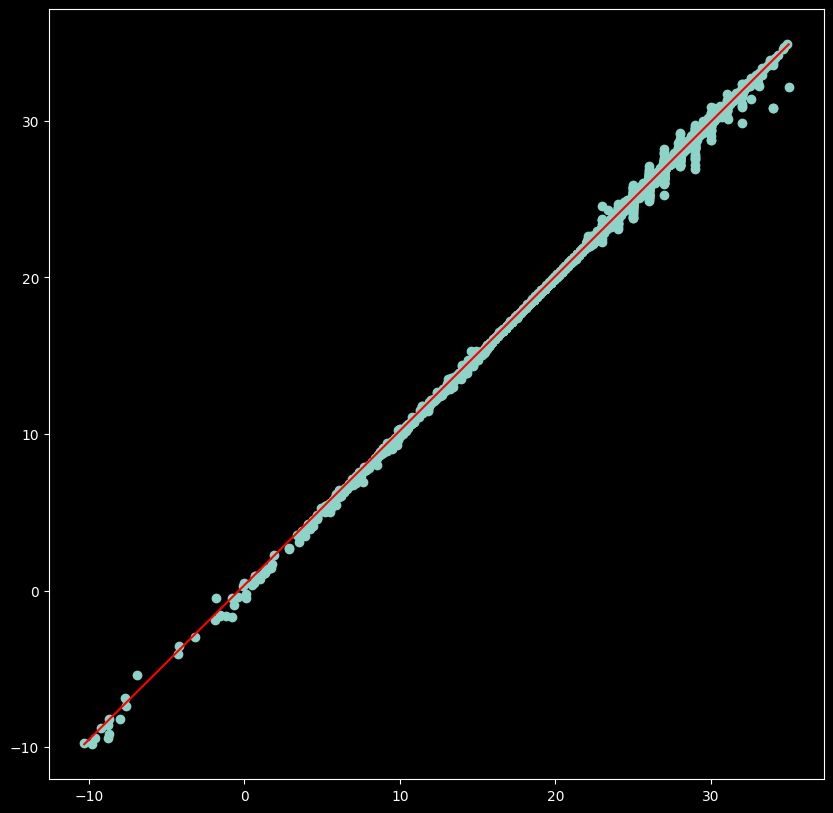

In [56]:
forest =RandomForestRegressor(n_estimators=100 , random_state=0)
forest.fit(X_train , y_train)
forest_pred = forest.predict(X_test)
model_accuracy=r2_score(y_test , forest_pred)*100
print("Accuracy of the model is %.2f" %model_accuracy)
mse = np.mean((forest_pred - y_test)**2)
print("Mean Square Error:",mse)
plt.figure(figsize=(10,10))
plt.scatter(y_test,forest_pred)
plt.plot([min(y_test),max(y_test)],[min(forest_pred),max(forest_pred)],color='red')